# Convolutional Layers:

1. neurons in the first convolutional layer are not connected to every single
pixel in the input image (like they were in the layers discussed in previous
chapters), but only to pixels in their receptive fields.

2. In
turn, each neuron in the second convolutional layer is connected only to
neurons located within a small rectangle in the first layer. This architecture
allows the network to concentrate on small low-level features in the first
hidden layer, then assemble them into larger higher-level features in the
next hidden layer, and so on.

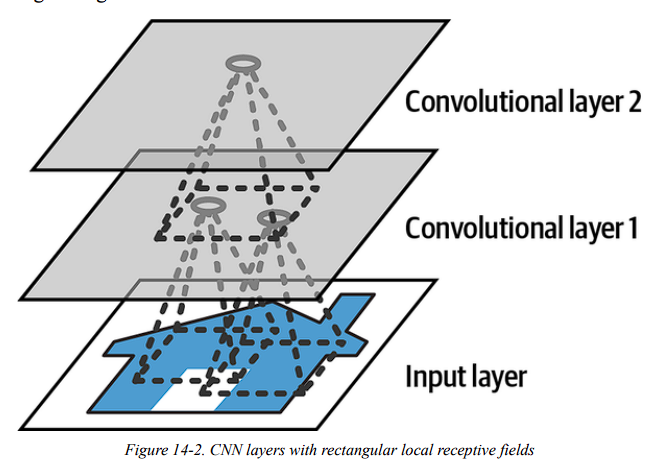

3. A neuron located in row i, column j of a given layer is connected to the
outputs of the neurons in the previous layer located in rows i to i + f_h – 1,
columns j to j + f_w – 1, where f_h and f_w are the height and width of the
receptive field.

4. In order for a layer to have the same
height and width as the previous layer, it is common to add zeros around the
inputs, as shown in the diagram. This is called zero padding.

5. The horizontal or vertical
step size from one receptive field to the next is called the stride.

6. A neuron
located in row i, column j in the upper layer is connected to the outputs of
the neurons in the previous layer located in rows i × s_h to i × s_h + f_h – 1,
columns j × s_w to j × s_w + f_w – 1, where s_h and s_w are the vertical and
horizontal strides.
Figure 14-3. Connections between layers and zero padding.


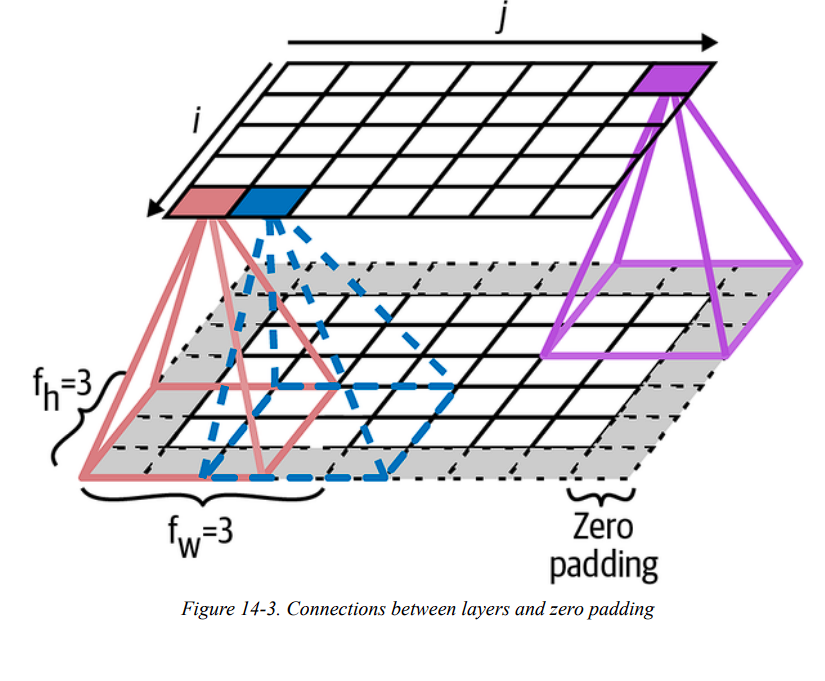

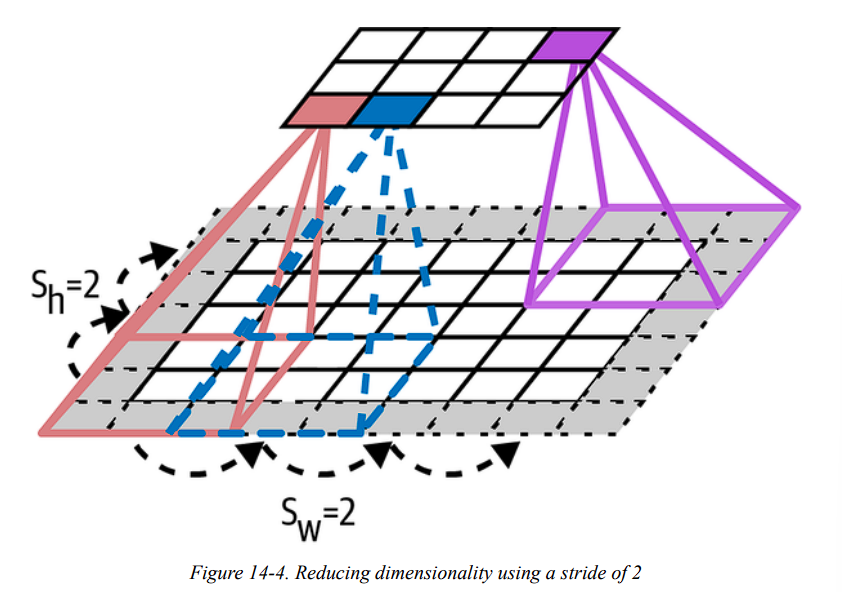

### Filters

1. A neuron’s weights can be represented as a small image the size of the
receptive field.

2. For example, Figure 14-5 shows two possible sets of
weights, called filters (or convolution kernels, or just kernels). The first one
is represented as a black square with a vertical white line in the middle (it’s
a 7 × 7 matrix full of 0s except for the central column, which is full of 1s);
neurons using these weights will ignore everything in their receptive field
except for the central vertical line (since all inputs will be multiplied by 0,
except for the ones in the central vertical line). The second filter is a black
square with a horizontal white line in the middle. Neurons using these
weights will ignore everything in their receptive field except for the central
horizontal line.

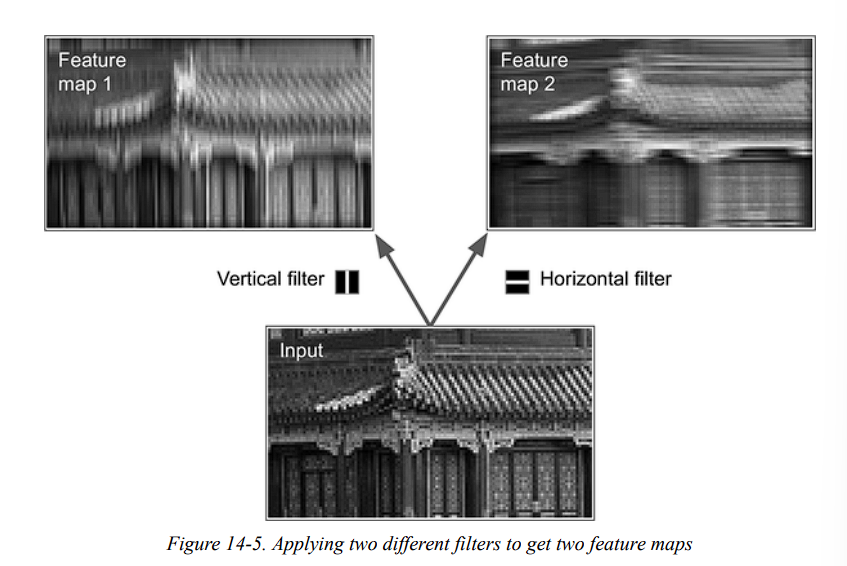

3. during training the convolutional layer will automatically learn the
most useful filters for its task, and the layers above will learn to combine
them into more complex patterns.


4. a layer full of neurons using the same filter outputs a
feature map, which highlights the areas in an image that activate the filter
the most.

### Stacking Multiple Feature Maps

1. a convolutional layer has
multiple filters (you decide how many) and outputs one feature map per
filter, so it is more accurately represented in 3D (see Figure 14-6).

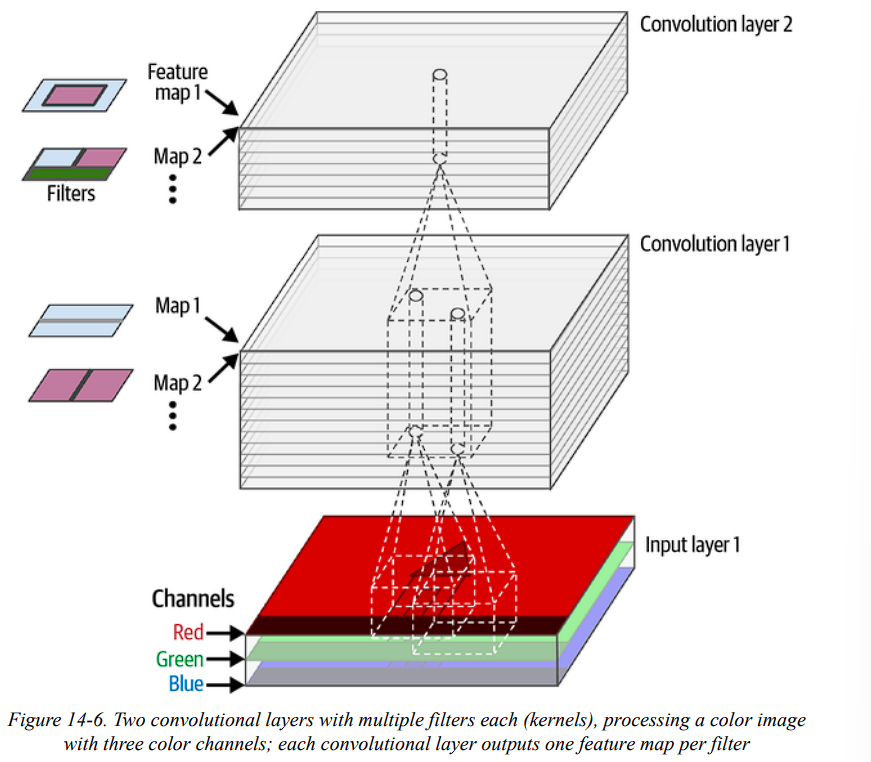

2. It has
one neuron per pixel in each feature map, and all neurons within a given
feature map share the same parameters (i.e., the same kernel and bias term).

3.  a convolutional layer
simultaneously applies multiple trainable filters to its inputs, making it
capable of detecting multiple features anywhere in its inputs.

4. Input images are also composed of multiple sublayers: one per color
channel.

>  NOTE
The fact that all neurons in a feature map share the same parameters dramatically
reduces the number of parameters in the model. Once the CNN has learned to recognize
a pattern in one location, it can recognize it in any other location. In contrast, once a
fully connected neural network has learned to recognize a pattern in one location, it can
only recognize it in that particular location.

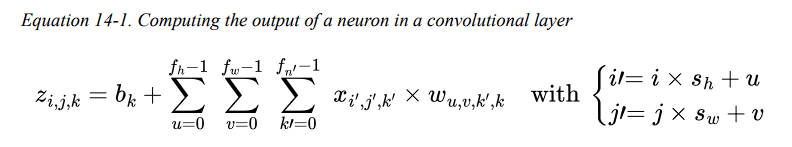

* In this equation:
    * z_i,j,k is the output of the neuron located in row i, column j in feature
    map k of the convolutional layer (layer l).

    * s_h and s_w are the vertical and horizontal strides, f_h
    and f_w are the height and width of the receptive field, and f_n' is the
    number of feature maps in the previous layer (layer l – 1).

    * x_i',j',k' is the output of the neuron located in layer l – 1, row i′, column
    j′, feature map k′ (or channel k′ if the previous layer is the input layer).

    * b_k is the bias term for feature map k (in layer l). You can think of it as a
    knob that tweaks the overall brightness of the feature map k.

    * w_u, v, k′, k  is the connection weight between any neuron in feature map k
    of the layer l and its input located at row u, column v (relative to the
    neuron’s receptive field), and feature map k′.

    



### Implementing Covolutional layers with keras

In [35]:
"""First, let’s load and preprocess a couple of sample images, using ScikitLearn’s load_sample_image() function and Keras’s CenterCrop and
Rescaling layers"""

from sklearn.datasets import load_sample_images
import tensorflow as tf

images = load_sample_images()["images"]
images = tf.keras.layers.CenterCrop(height=70, width=120)(images)
images = tf.keras.layers.Rescaling(scale=1 / 255)(images)


In [36]:
"""
(two sample images, height,width,three channels)
"""
images.shape

TensorShape([2, 70, 120, 3])

In [37]:
#   let’s create a 2D convolutional layer and feed it these images to see
# what comes out

""". Let’s create a convolutional layer with 32 filters, each of size 7 ×
7 (using kernel_size=7, which is equivalent to using kernel_size=(7 ,
7)), and apply this layer to our small batch of two images:"""

conv_layer = tf.keras.layers.Conv2D(filters=32,kernel_size=7)
fmaps = conv_layer(images)

>NOTE: When we talk about a 2D convolutional layer, “2D” refers to the number of spatial
dimensions (height and width), but as you can see, the layer takes 4D inputs: as we saw,
the two additional dimensions are the batch size (first dimension) and the channels (last
dimension).


In [38]:
fmaps.shape

TensorShape([2, 64, 114, 32])

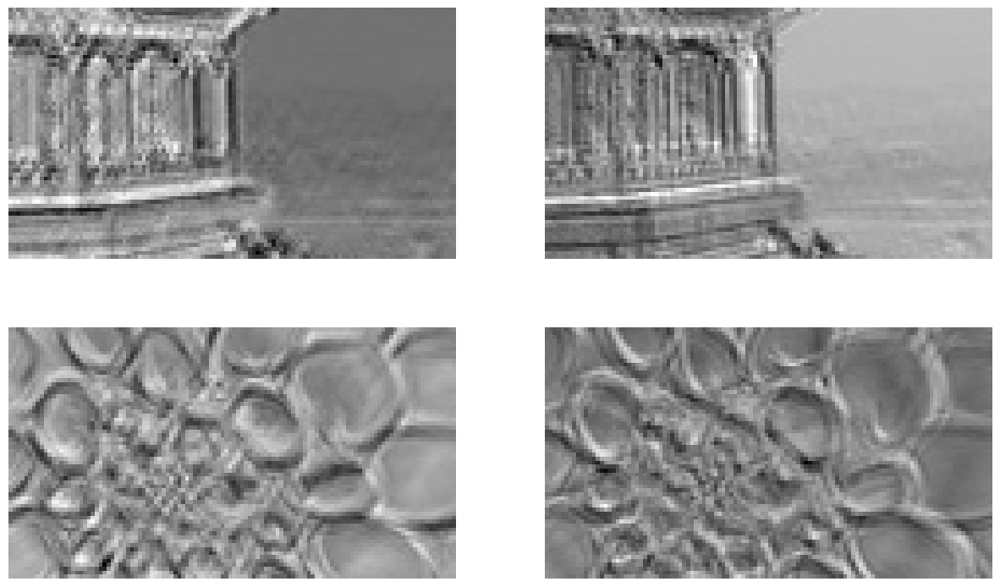

In [40]:
# extra code – displays the two output feature maps for each image
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 9))
for image_idx in (0, 1):
    for fmap_idx in (0, 1):
        plt.subplot(2, 2, image_idx * 2 + fmap_idx + 1)
        plt.imshow(fmaps[image_idx, :, :, fmap_idx], cmap="gray")
        plt.axis("off")

plt.show()

As you can see, randomly generated filters typically act like edge detectors, which is great since that's a useful tool in image processing, and that's the type of filters that a convolutional layer typically starts with. Then, during training, it gradually learns improved filters to recognize useful patterns for the task.

The output shape is similar to the input shape, with two main differences:

* there are 32 channels instead of 3. This is because we set
filters=32, so we get 32 output feature maps: instead of the intensity of
red, green, and blue at each location, we now have the intensity of each
feature at each location.

* Second, the height and width have both shrunk by
6 pixels. This is due to the fact that the Conv2D layer does not use any zeropadding by default, which means that we lose a few pixels on the sides of
the output feature maps, depending on the size of the filters. In this case,
since the kernel size is 7, we lose 6 pixels horizontally and 6 pixels
vertically (i.e., 3 pixels on each side).

> WARNING:
The default option is surprisingly named padding="valid", which actually means no
zero-padding at all! This name comes from the fact that in this case every neuron’s
receptive field lies strictly within valid positions inside the input (it does not go out of
bounds). It’s not a Keras naming quirk: everyone uses this odd nomenclature.



Now let's use zero-padding:

In [41]:
"""If instead we set padding="same", then the inputs are padded with enough
zeros on all sides to ensure that the output feature maps end up with the
same size as the inputs"""

conv_layer = tf.keras.layers.Conv2D(filters=32,kernel_size=7,
                                    padding="same")
fmaps = conv_layer(images)


In [42]:
fmaps.shape

TensorShape([2, 70, 120, 32])

In [43]:
# extra code – shows that the output shape when we set strides=2
conv_layer = tf.keras.layers.Conv2D(filters=32, kernel_size=7, padding="same",
                                    strides=2)
fmaps = conv_layer(images)
fmaps.shape

TensorShape([2, 35, 60, 32])

In [44]:
# extra code – this utility function can be useful to compute the size of the
#              feature maps output by a convolutional layer. It also returns
#              the number of ignored rows or columns if padding="valid", or the
#              number of zero-padded rows or columns if padding="same"."""

import numpy as np

def conv_output_size(input_size, kernel_size, strides=1, padding="valid"):
    if padding=="valid":
        z = input_size - kernel_size + strides
        output_size = z // strides
        num_ignored = z % strides
        return output_size, num_ignored
    else:
        output_size = (input_size - 1) // strides + 1
        num_padded = (output_size - 1) * strides + kernel_size - input_size
        return output_size, num_padded

conv_output_size(np.array([70, 120]), kernel_size=7, strides=2, padding="same")

(array([35, 60]), array([5, 5]))

1. If the stride is greater than 1 (in any direction), then the output size will not
be equal to the input size, even if padding="same". For example, if you set
strides=2 (or equivalently strides=(2, 2)), then the output feature
maps will be 35 × 60: halved both vertically and horizontally.

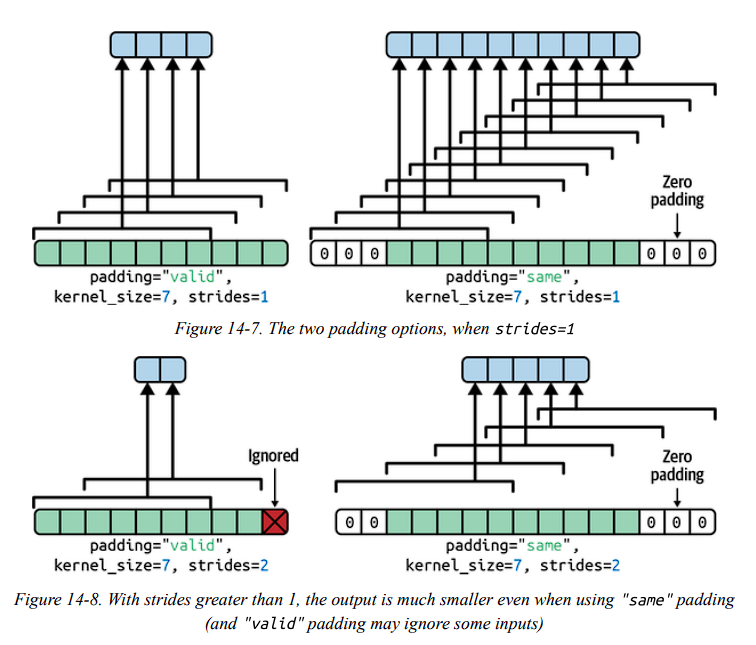

2. How Output Size is Computed?

* With padding="valid", if the width of the input is i_h , then the output
width is equal to (i_h – f_h + s_h ) / s_h , rounded down. Any remainder in the
division corresponds to ignored columns on the right side of the input
image. The same logic can be used to compute the output height, and
any ignored rows at the bottom of the image.

* With padding="same", the output width is equal to i_h / s_h , rounded up. To make this possible, the appropriate number of zero columns are
padded to the left and right of the input image (an equal number if
possible, or just one more on the right side). Assuming the output
width is o_w , then the number of padded zero columns is (o_w – 1) × s_h +
f_h – i_h . Again, the same logic can be used to compute the output height
and the number of padded rows.

3.  


In [8]:
"""Now let’s look at the layer’s weights (which were noted w_u, v, k′, k and b_k in
Equation 14-1)."""

"""The kernels are initialized
randomly, while the biases are initialized to zero. These weights are
accessible as TF variables via the weights attribute, or as NumPy arrays
via the get_weights() method:"""

"""The kernels array is 4D, and its shape is [kernel_height, kernel_width,
input_channels, output_channels]. The biases array is 1D, with shape
[output_channels]"""

"""The number of output channels is equal to the number of
output feature maps, which is also equal to the number of filters.
"""

kernels,biases = conv_layer.get_weights()
kernels.shape,biases.shape

((7, 7, 3, 32), (32,))

4. a convolutional layer performs a linear operation, so if
you stacked multiple convolutional layers without any activation functions
they would all be equivalent to a single convolutional layer, and they
wouldn’t be able to learn anything really complex.



Let's manually create two filters full of zeros, except for a vertical line of 1s in the first filter, and a horizontal one in the second filter (just like in Figure 14–5). The two output feature maps highlight vertical lines and horizontal lines, respectively. In practice you will probably never need to create filters manually, since the convolutional layers will learn them automatically.

In [47]:
# extra code – shows how to use the tf.nn.conv2d() operation

tf.random.set_seed(42)
filters = tf.random.normal([7, 7, 3, 2])
biases = tf.zeros([2])
fmaps = tf.nn.conv2d(images, filters, strides=1, padding="SAME") + biases

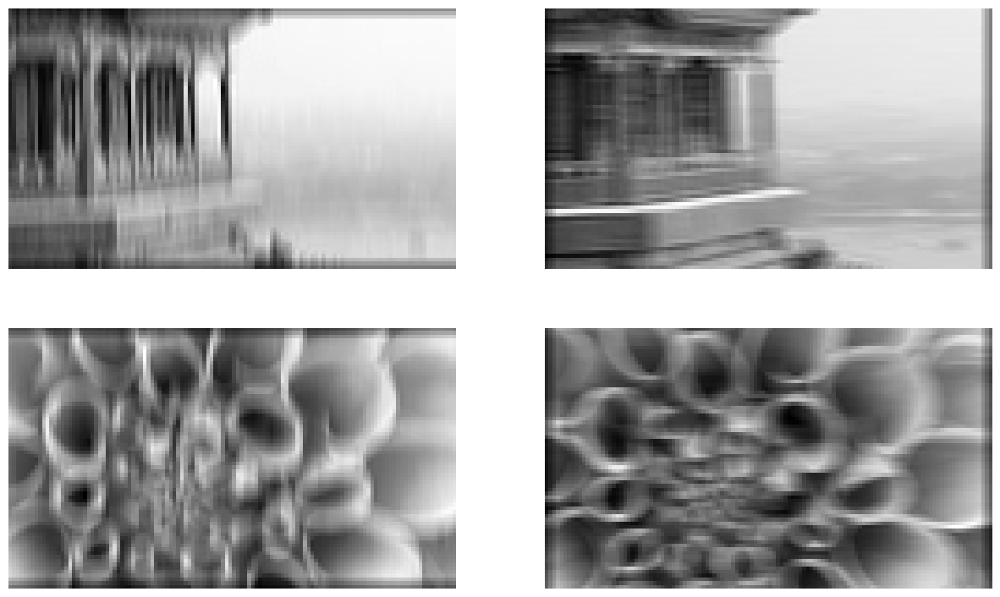

In [50]:
# extra code – shows how to manually create two filters to get images similar
#              to those in Figure 14–5.

plt.figure(figsize=(15, 9))
filters = np.zeros([7, 7, 3, 2])
filters[:, 3, :, 0] = 1
filters[3, :, :, 1] = 1
fmaps = tf.nn.conv2d(images, filters, strides=1, padding="SAME") + biases

for image_idx in (0, 1):
    for fmap_idx in (0, 1):
        plt.subplot(2, 2, image_idx * 2 + fmap_idx + 1)
        plt.imshow(fmaps[image_idx, :, :, fmap_idx], cmap="gray")
        plt.axis("off")

plt.show()

Notice the dark lines at the top and bottom of the two images on the left, and on the left and right of the two images on the right? Can you guess what these are? Why were they not present in the previous figure?

You guessed it! These are artifacts due to the fact that we used zero padding in this case, while we did not use zero padding to create the feature maps in the previous figure. Because of zero padding, the two feature maps based on the vertical line filter (i.e., the two left images) could not fully activate near the top and bottom of the images. Similarly, the two feature maps based on the horizontal line filter (i.e., the two right images) could not fully activate near the left and right of the images

### Memory Requirements

1. especially during training, because the
reverse pass of backpropagation requires all the intermediate values
computed during the forward pass.


2. For example, consider a convolutional layer with 200 5 × 5 filters, with
stride 1 and "same" padding. If the input is a 150 × 100 RGB image (three
channels), then the number of parameters is (5 × 5 × 3 + 1) × 200 = 15,200
(the + 1 corresponds to the bias terms), which is fairly small compared to a
fully connected layer. However, each of the 200 feature maps contains 150
× 100 neurons, and each of these neurons needs to compute a weighted sum
of its 5 × 5 × 3 = 75 inputs: that’s a total of 225 million float
multiplications. Not as bad as a fully connected layer, but still quite
computationally intensive. Moreover, if the feature maps are represented
using 32-bit floats, then the convolutional layer’s output will occupy 200 ×
150 × 100 × 32 = 96 million bits (12 MB) of RAM. And that’s just for one
instance—if a training batch contains 100 instances, then this layer will use
up 1.2 GB of RAM!

3. But during training everything computed during the
forward pass needs to be preserved for the reverse pass, so the amount of
RAM needed is (at least) the total amount of RAM required by all layers.

>TIP: If training crashes because of an out-of-memory error, you can try reducing the minibatch size. Alternatively, you can try reducing dimensionality using a stride, removing a
few layers, using 16-bit floats instead of 32-bit floats, or distributing the CNN across
multiple devices.




### Pooling Layers

1. Their goal is to subsample (i.e., shrink) the input image
in order to reduce the computational load, the memory usage, and the
number of parameters (thereby limiting the risk of overfitting).

2. each neuron in a pooling layer is
connected to the outputs of a limited number of neurons in the previous
layer, located within a small rectangular receptive field. You must define its
size, the stride, and the padding type, just like before.

3. a pooling
neuron has no weights; all it does is aggregate the inputs using an
aggregation function such as the max or mean.

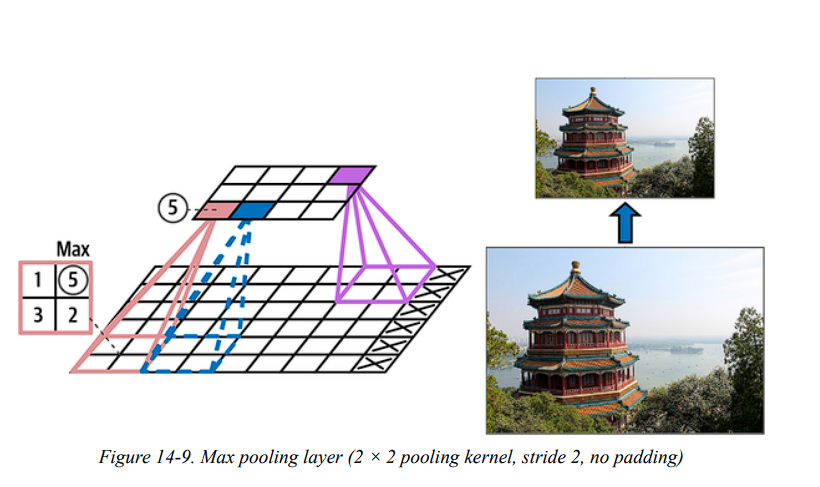

> NOTE
A pooling layer typically works on every input channel independently, so the output
depth (i.e., the number of channels) is the same as the input depth.

4. By inserting a max pooling layer every few
layers in a CNN, it is possible to get some level of translation invariance at
a larger scale. Moreover, max pooling offers a small amount of rotational
invariance and a slight scale invariance. Such invariance (even if it is
limited) can be useful in cases where the prediction should not depend on
these details, such as in classification tasks.

5. max pooling has some downsides too. It’s obviously very
destructive: even with a tiny 2 × 2 kernel and a stride of 2, the output will
be two times smaller in both directions (so its area will be four times
smaller), simply dropping 75% of the input values. 
The goal in this case is equivariance,
not invariance: a small change to the inputs should lead to a corresponding
small change in the output.

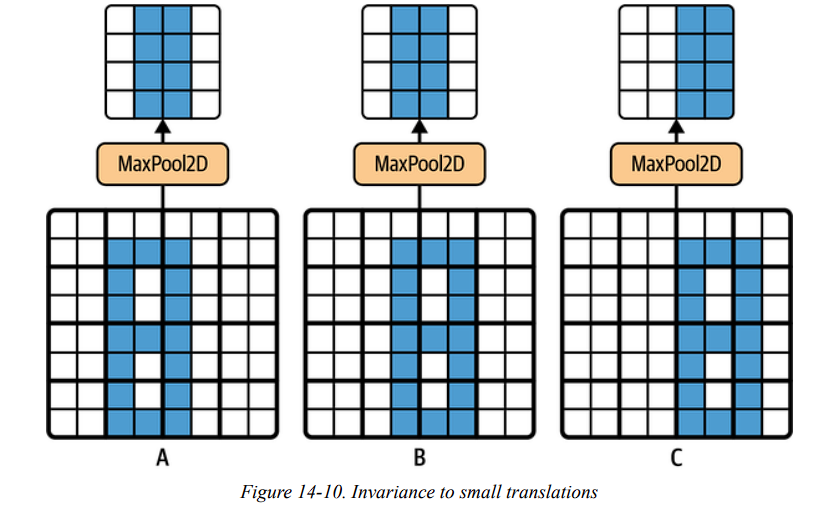



### Implementing Pooling layers with Keras

In [51]:
"""The following code creates a MaxPooling2D layer, alias MaxPool2D, using a
2 × 2 kernel. The strides default to the kernel size, so this layer uses a stride
of 2 (horizontally and vertically). By default, it uses "valid" padding (i.e.,
no padding at all):"""

max_pool = tf.keras.layers.MaxPool2D(pool_size=2)


In [52]:
output = max_pool(images)

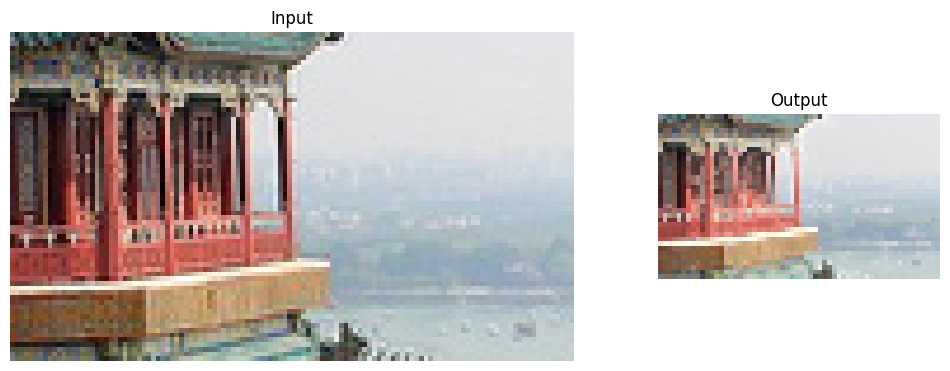

In [53]:
# extra code – this cells shows what max pooling with stride = 2 looks like

import matplotlib as mpl

fig = plt.figure(figsize=(12, 8))
gs = mpl.gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[2, 1])

ax1 = fig.add_subplot(gs[0, 0])
ax1.set_title("Input")
ax1.imshow(images[0])  # plot the 1st image
ax1.axis("off")
ax2 = fig.add_subplot(gs[0, 1])
ax2.set_title("Output")
ax2.imshow(output[0])  # plot the output for the 1st image
ax2.axis("off")
plt.show()

1. To create an average pooling layer, just use AveragePooling2D, alias
AvgPool2D, instead of MaxPool2D. As you might expect, it works exactly
like a max pooling layer, except it computes the mean rather than the max. 

>Note that max pooling and average pooling can be performed along the
depth dimension instead of the spatial dimensions, although it’s not as
common. This can allow the CNN to learn to be invariant to various
features. For example, it could learn multiple filters, each detecting a
different rotation of the same pattern (such as handwritten digits; see
Figure 14-11), and the depthwise max pooling layer would ensure that the
output is the same regardless of the rotation. The CNN could similarly learn
to be invariant to anything: thickness, brightness, skew, color, and so on.

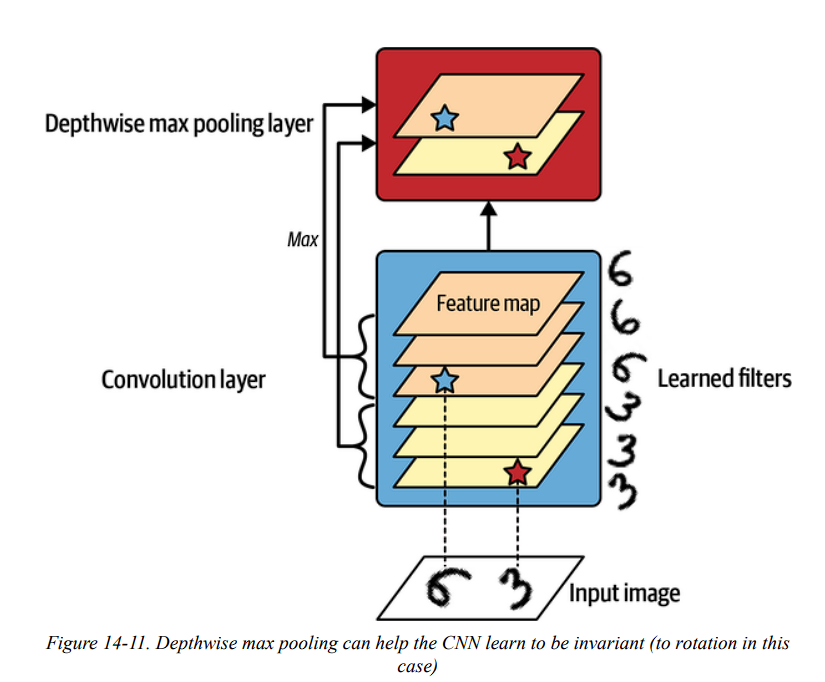



Depth-wise pooling

In [54]:
# extra code – shows how to use the max_pool() op; only works on the CPU
np.random.seed(42)
fmaps = np.random.rand(2, 70, 120, 60)
with tf.device("/cpu:0"):
    output = tf.nn.max_pool(fmaps, ksize=(1, 1, 1, 3), strides=(1, 1, 1, 3),
                            padding="VALID")
output.shape

TensorShape([2, 70, 120, 20])

In [55]:
"""Keras does not include a depthwise max pooling layer, but it’s not too
difficult to implement a custom layer for that:
"""

"""This layer reshapes its inputs to split the channels into groups of the desired
size (pool_size), then it uses tf.reduce_max() to compute the max of
each group. This implementation assumes that the stride is equal to the pool
size, which is generally what you want."""

class DepthPool(tf.keras.layers.Layer):
    def __init__(self,pool_size=2,**kwargs):
        super().__init__(**kwargs)
        self.pool_size = pool_size

    def call(self,inputs):
        shape = tf.shape(inputs) # shape[-1] is the number of channels
        groups = shape[-1] // self.pool_size # number of channel groups
        new_shape = tf.concat([shape[:-1],[groups,self.pool_size]],axis=0)
        return tf.reduce_max(tf.reshape(inputs,new_shape),axis=-1)
    

In [56]:
# extra code – shows that this custom layer gives the same result as max_pool()
np.allclose(DepthPool(pool_size=3)(fmaps), output)

True

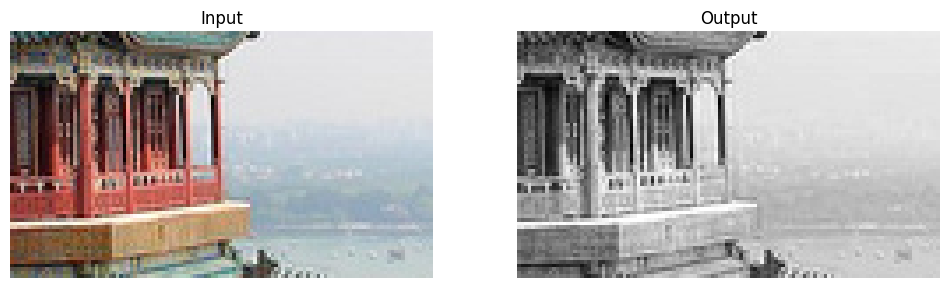

In [57]:
# extra code – computes and displays the output of the depthwise pooling layer

depth_output = DepthPool(pool_size=3)(images)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.title("Input")
plt.imshow(images[0])  # plot the 1st image
plt.axis("off")
plt.subplot(1, 2, 2)
plt.title("Output")
plt.imshow(depth_output[0, ..., 0], cmap="gray")  # plot 1st image's output
plt.axis("off")
plt.show()

>NOTE: Alternatively, you could use
TensorFlow’s tf.nn.max_pool() operation, and wrap in a Lambda layer to
use it inside a Keras model, but sadly this op does not implement depthwise
pooling for the GPU, only for the CPU.



3. global average pooling layer:
* It works very differently:
all it does is compute the mean of each entire feature map (it’s like an
average pooling layer using a pooling kernel with the same spatial
dimensions as the inputs). 

*  it just outputs a single number
per feature map and per instance. Although this is of course extremely
destructive (most of the information in the feature map is lost), it can be
useful just before the output layer.

In [58]:
""" To
create such a layer, simply use the GlobalAveragePooling2D class, alias
GlobalAvgPool2D:"""

global_avg_pool = tf.keras.layers.GlobalAvgPool2D()


In [60]:
# ALternatively:
global_avg_pool = tf.keras.layers.Lambda(
    lambda X: tf.reduce_mean(X,axis=[1,2])
)

In [61]:
global_avg_pool(images) # gives mean intensities of R,G and B for each img

<tf.Tensor: shape=(2, 3), dtype=float32, numpy=
array([[0.64338624, 0.5971759 , 0.5824972 ],
       [0.76306933, 0.2601113 , 0.10849128]], dtype=float32)>

### CNN Architectures

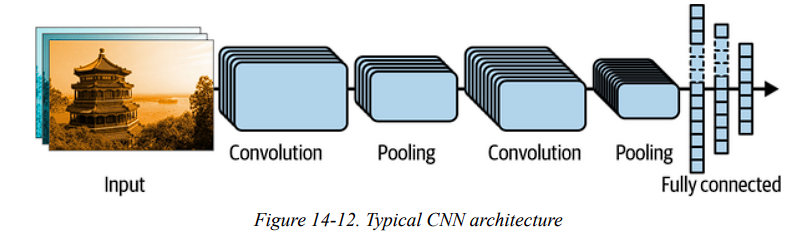

>TIP
A common mistake is to use convolution kernels that are too large. For example, instead
of using a convolutional layer with a 5 × 5 kernel, stack two layers with 3 × 3 kernels: it
will use fewer parameters and require fewer computations, and it will usually perform
better. One exception is for the first convolutional layer: it can typically have a large
kernel (e.g., 5 × 5), usually with a stride of 2 or more. This will reduce the spatial
dimension of the image without losing too much information, and since the input image
only has three channels in general, it will not be too costly.



Tackling Fashion MNIST With a CNN

In [62]:
# extra code – loads the mnist dataset, add the channels axis to the inputs,
#              scales the values to the 0-1 range, and splits the dataset
mnist = tf.keras.datasets.fashion_mnist.load_data()
(X_train_full, y_train_full), (X_test, y_test) = mnist
X_train_full = np.expand_dims(X_train_full, axis=-1).astype(np.float32) / 255
X_test = np.expand_dims(X_test.astype(np.float32), axis=-1) / 255
X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

In [63]:
from functools import partial

DefaultConv2D = partial(tf.keras.layers.Conv2D,
                        kernel_size=3,
                        padding="same",
                        activation="relu",
                        kernel_initializer="he_normal")

model = tf.keras.Sequential([
    DefaultConv2D(filters=64,
                  kernel_size=7,
                  input_shape=[28,28,1]),
    tf.keras.layers.MaxPool2D(),
    DefaultConv2D(filters=128),
    DefaultConv2D(filters=128),
    tf.keras.layers.MaxPool2D(),
    DefaultConv2D(filters=256),
    DefaultConv2D(filters=256),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=128,
                          activation="relu",
                          kernel_initializer="he_normal"),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(units=64,activation="relu",
                          kernel_initializer="he_normal"),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(units=10,
                          activation="softmax")
                          
])



COde Explanation:

* We use the functools.partial() function (introduced in
Chapter 11) to define DefaultConv2D, which acts just like Conv2D but
with different default arguments: a small kernel size of 3, "same"
padding, the ReLU activation function, and its corresponding He
initializer.

* Next, we create the Sequential model. Its first layer is a
DefaultConv2D with 64 fairly large filters (7 × 7). It uses the default
stride of 1 because the input images are not very large. It also sets
input_shape=[28, 28, 1], because the images are 28 × 28 pixels,
with a single color channel (i.e., grayscale).When you load the
Fashion MNIST dataset, make sure each image has this shape: you
may need to use np.reshape() or np.expanddims() to add the
channels dimension. Alternatively, you could use a Reshape layer as
the first layer in the model.

* We then add a max pooling layer that uses the default pool size of 2, so
it divides each spatial dimension by a factor of 2.

* Then we repeat the same structure twice: two convolutional layers
followed by a max pooling layer. For larger images, we could repeat
this structure several more times. The number of repetitions is a
hyperparameter you can tune.

* Note that the number of filters doubles as we climb up the CNN
toward the output layer (it is initially 64, then 128, then 256): it makes
sense for it to grow, since the number of low-level features is often
fairly low (e.g., small circles, horizontal lines), but there are many
different ways to combine them into higher-level features. It is a
common practice to double the number of filters after each pooling
layer: since a pooling layer divides each spatial dimension by a factor
of 2, we can afford to double the number of feature maps in the next
layer without fear of exploding the number of parameters, memory
usage, or computational load.

* Next is the fully connected network, composed of two hidden dense
layers and a dense output layer. Since it’s a classification task with 10
classes, the output layer has 10 units, and it uses the softmax activation
function. Note that we must flatten the inputs just before the first dense
layer, since it expects a 1D array of features for each instance. We also
add two dropout layers, with a dropout rate of 50% each, to reduce
overfitting.
 

In [64]:
# extra code – compiles, fits, evaluates, and uses the model to make predictions
model.compile(loss="sparse_categorical_crossentropy", optimizer="nadam",
              metrics=["accuracy"])
history = model.fit(X_train, y_train, epochs=10,
                    validation_data=(X_valid, y_valid))
score = model.evaluate(X_test, y_test)
X_new = X_test[:10]  # pretend we have new images
y_pred = model.predict(X_new)

Epoch 1/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 239s 136ms/step - accuracy: 0.5987 - loss: 1.1397 - val_accuracy: 0.8746 - val_loss: 0.3684
Epoch 2/10
 266/1719 ━━━━━━━━━━━━━━━━━━━━ 3:16 135ms/step - accuracy: 0.8452 - loss: 0.4587

KeyboardInterrupt: 

### LeNet-5

1. widely used for handwritten digit recognition (MNIST).

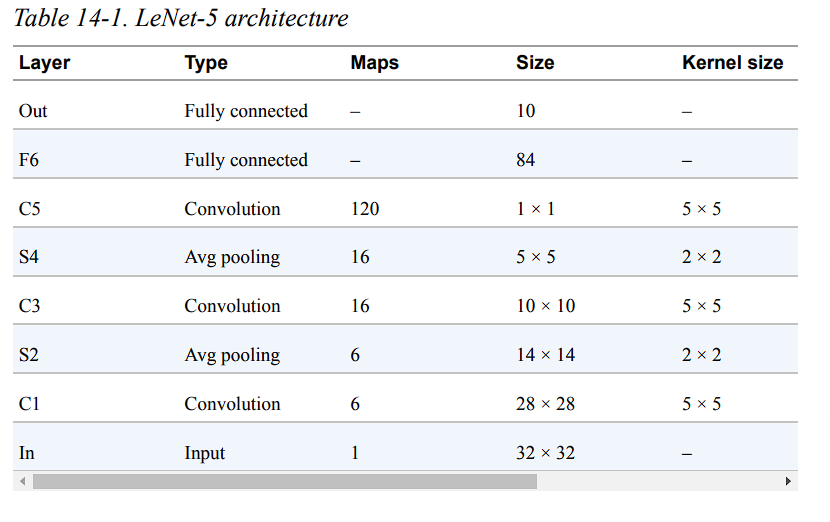

### AlexNet

1. It is
similar to LeNet-5, only much larger and deeper, and it was the first to stack
convolutional layers directly on top of one another, instead of stacking a
pooling layer on top of each convolutional layer.

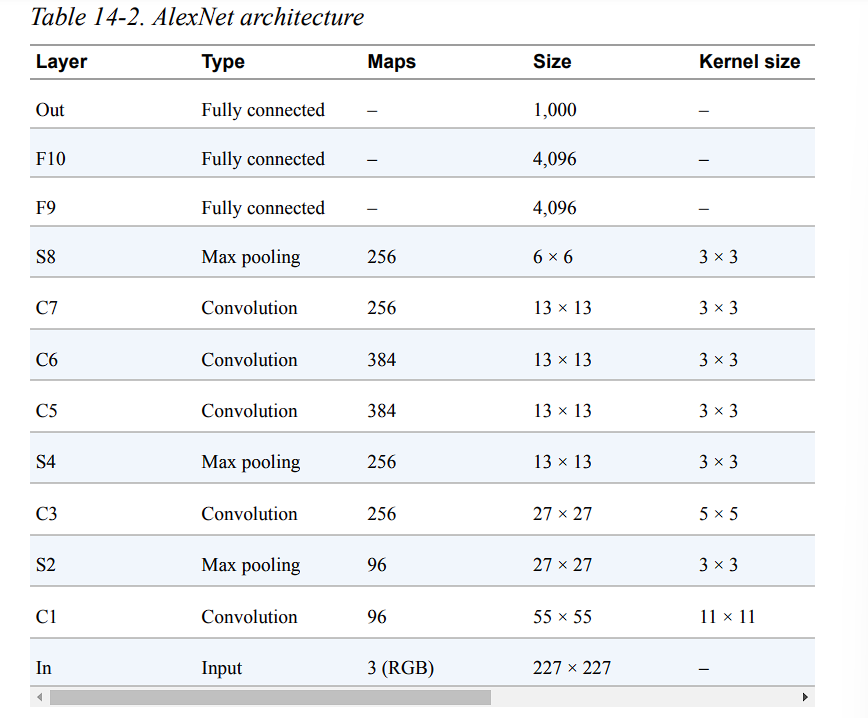

2. To reduce overfitting, the authors used two regularization techniques. First,
they applied dropout (introduced in Chapter 11) with a 50% dropout rate
during training to the outputs of layers F9 and F10. Second, they performed
data augmentation by randomly shifting the training images by various
offsets, flipping them horizontally, and changing the lighting conditions.

> Data augmentation is also useful when you have an unbalanced dataset:
you can use it to generate more samples of the less frequent classes.
This is called the synthetic minority oversampling technique, or
SMOTE for short.

3. AlexNet also uses a competitive normalization step immediately after the
ReLU step of layers C1 and C3, called local response normalization (LRN):
the most strongly activated neurons inhibit other neurons located at the
same position in neighboring feature maps. Such competitive activation has
been observed in biological neurons. This encourages different feature maps
to specialize, pushing them apart and forcing them to explore a wider range
of features, ultimately improving generalization.

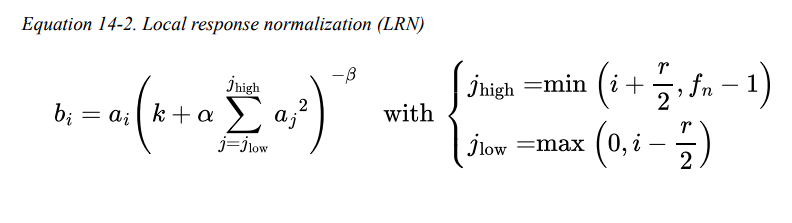

in this equation:
* b_i is the normalized output of the neuron located in feature map i, at
some row u and column v (note that in this equation we consider only
neurons located at this row and column, so u and v are not shown).

* a_i is the activation of that neuron after the ReLU step, but before
normalization.

* k, α, β, and r are hyperparameters. k is called the bias, and r is called
the depth radius.

* f_n is the number of feature maps.

4. In AlexNet, the hyperparameters are set as: r = 5, α = 0.0001, β = 0.75, and
k = 2. You can implement this step by using the
tf.nn.local_response_normalization() function (which you can wrap
in a Lambda layer if you want to use it in a Keras model).





### GoogLeNet

1. This was made possible by
subnetworks called inception modules, which allow GoogLeNet to use
parameters much more efficiently than previous architectures: GoogLeNet
actually has 10 times fewer parameters than AlexNet (roughly 6 million
instead of 60 million).


2. architecture of an inception module:

*  The notation
“3 × 3 + 1(S)” means that the layer uses a 3 × 3 kernel, stride 1, and "same"
padding. The input signal is first fed to four different layers in parallel. All
convolutional layers use the ReLU activation function.

*  Note that the top
convolutional layers use different kernel sizes (1 × 1, 3 × 3, and 5 × 5),
allowing them to capture patterns at different scales.

* Also note that every
single layer uses a stride of 1 and "same" padding (even the max pooling
layer), so their outputs all have the same height and width as their inputs.
This makes it possible to concatenate all the outputs along the depth
dimension in the final depth concatenation layer (i.e., to stack the feature
maps from all four top convolutional layers). ( It can be implemented using
Keras’s Concatenate layer, using the default axis=-1)

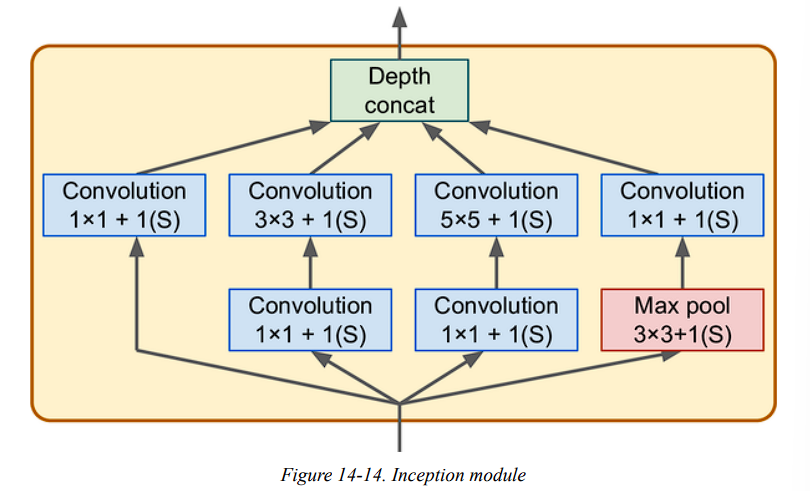


3. You may wonder why inception modules have convolutional layers with 1
× 1 kernels. Surely these layers cannot capture any features because they
look at only one pixel at a time, right? In fact, these layers serve three
purposes:

* Although they cannot capture spatial patterns, they can capture
patterns along the depth dimension (i.e., across channels).

* They are configured to output fewer feature maps than their inputs, so
they serve as bottleneck layers, meaning they reduce dimensionality.
This cuts the computational cost and the number of parameters,
speeding up training and improving generalization.

* Each pair of convolutional layers ([1 × 1, 3 × 3] and [1 × 1, 5 × 5]) acts
like a single powerful convolutional layer, capable of capturing more
complex patterns. A convolutional layer is equivalent to sweeping a
dense layer across the image (at each location, it only looks at a small
receptive field), and these pairs of convolutional layers are equivalent
to sweeping two-layer neural networks across the image.

4. Let's go thru this network:

* The first two layers divide the image’s height and width by 4 (so its
area is divided by 16), to reduce the computational load. The first layer
uses a large kernel size, 7 × 7, so that much of the information is
preserved.

* Then the local response normalization layer ensures that the previous
layers learn a wide variety of features.

* Two convolutional layers follow, where the first acts like a bottleneck
layer.

* Again, a local response normalization layer ensures that the previous
layers capture a wide variety of patterns.

* Next, a max pooling layer reduces the image height and width by 2,
again to speed up computations.

* Then comes the CNN’s backbone: a tall stack of nine inception
modules, interleaved with a couple of max pooling layers to reduce
dimensionality and speed up the net.

* Next, the global average pooling layer outputs the mean of each
feature map: this drops any remaining spatial information, which is
fine because there is not much spatial information left at that point.

* The last layers are self-explanatory: dropout for regularization, then a
fully connected layer with 1,000 units (since there are 1,000 classes)
and a softmax activation function to output estimated class
probabilities.

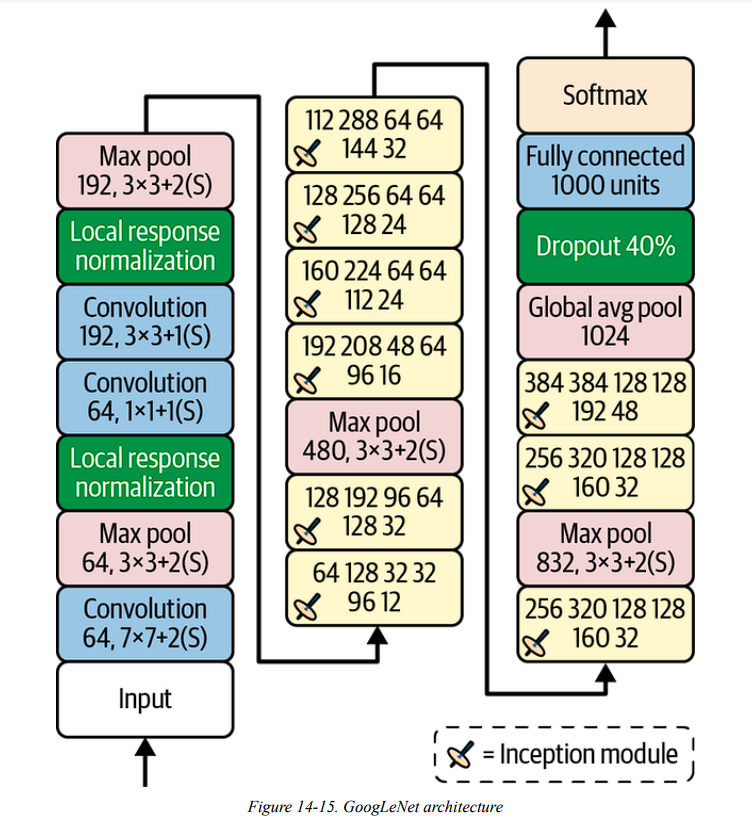

5. The original GoogLeNet architecture included two auxiliary classifiers
plugged on top of the third and sixth inception modules. They were both
composed of one average pooling layer, one convolutional layer, two fully
connected layers, and a softmax activation layer. During training, their loss
(scaled down by 70%) was added to the overall loss. The goal was to fight
the vanishing gradients problem and regularize the network, but it was later
shown that their effect was relatively minor.



### VGGNet

1. it had 2 or 3 convolutional layers and a pooling layer, then
again 2 or 3 convolutional layers and a pooling layer, and so on (reaching a
total of 16 or 19 convolutional layers, depending on the VGG variant), plus
a final dense network with 2 hidden layers and the output layer. It used
small 3 × 3 filters, but it had many of them.

### ResNet

1. The key to being able to train such a deep network is
to use skip connections (also called shortcut connections): the signal
feeding into a layer is also added to the output of a layer located higher up
the stack.

2. When training a neural network, the goal is to make it model a target
function h(x). If you add the input x to the output of the network (i.e., you
add a skip connection), then the network will be forced to model f(x) = h(x)
– x rather than h(x). This is called residual learning.

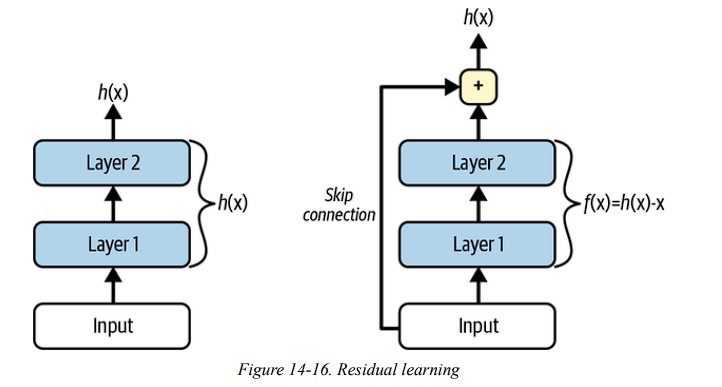

3. When you initialize a regular neural network, its weights are close to zero,
so the network just outputs values close to zero. If you add a skip
connection, the resulting network just outputs a copy of its inputs; in other
words, it initially models the identity function. If the target function is fairly
close to the identity function (which is often the case), this will speed up
training considerably.

4. Moreover, if you add many skip connections, the network can start making
progress even if several layers have not started learning yet (see Figure 14-
17). Thanks to skip connections, the signal can easily make its way across
the whole network. The deep residual network can be seen as a stack of
residual units (RUs), where each residual unit is a small neural network
with a skip connection.

5. It starts and ends exactly like GoogLeNet (except without a dropout
layer), and in between is just a very deep stack of residual units. Each
residual unit is composed of two convolutional layers (and no pooling
layer!), with batch normalization (BN) and ReLU activation, using 3 × 3
kernels and preserving spatial dimensions (stride 1, "same" padding).

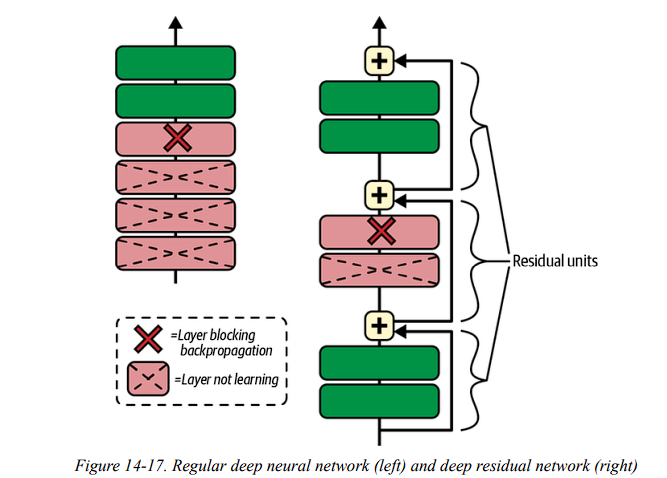

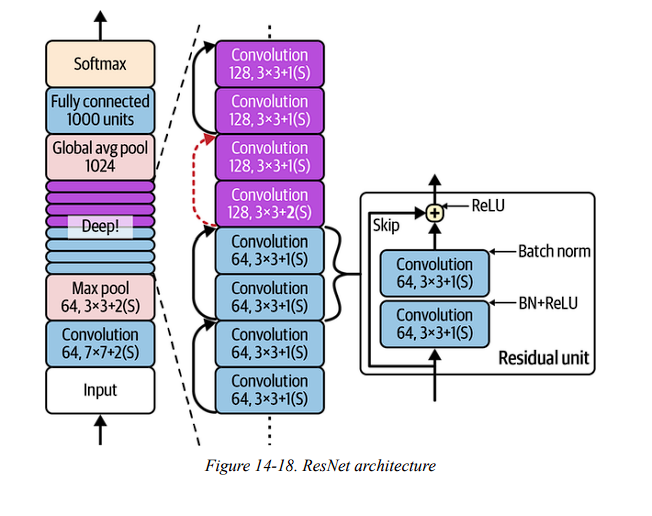

6. Note that the number of feature maps is doubled every few residual units, at
the same time as their height and width are halved (using a convolutional
layer with stride 2). When this happens, the inputs cannot be added directly
to the outputs of the residual unit because they don’t have the same shape
(for example, this problem affects the skip connection represented by the
dashed arrow in Figure 14-18). To solve this problem, the inputs are passed
through a 1 × 1 convolutional layer with stride 2 and the right number of
output feature maps.

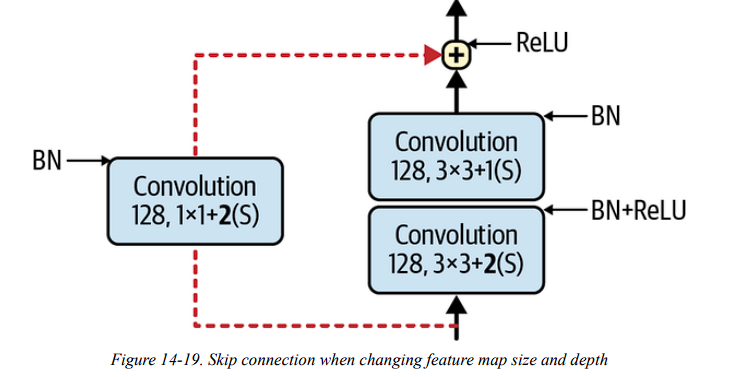

7. ResNets deeper than that, such as ResNet-152, use slightly different
residual units. Instead of two 3 × 3 convolutional layers with, say, 256
feature maps, they use three convolutional layers: first a 1 × 1 convolutional
layer with just 64 feature maps (4 × less), which acts as a bottleneck layer
(as discussed already), then a 3 × 3 layer with 64 feature maps, and finally
another 1 × 1 convolutional layer with 256 feature maps (4 times 64) that
restores the original depth. ResNet-152 contains 3 such RUs that output 256
maps, then 8 RUs with 512 maps, a whopping 36 RUs with 1,024 maps,
and finally 3 RUs with 2,048 maps.




### Xception  (Extreme Inception)

1. it replaces
the inception modules with a special type of layer called a depthwise
separable convolution layer (or separable convolution layer for short ).

2. While a regular
convolutional layer uses filters that try to simultaneously capture spatial
patterns (e.g., an oval) and cross-channel patterns (e.g., mouth + nose +
eyes = face), a separable convolutional layer makes the strong assumption
that spatial patterns and cross-channel patterns can be modeled separately
(see Figure 14-20).

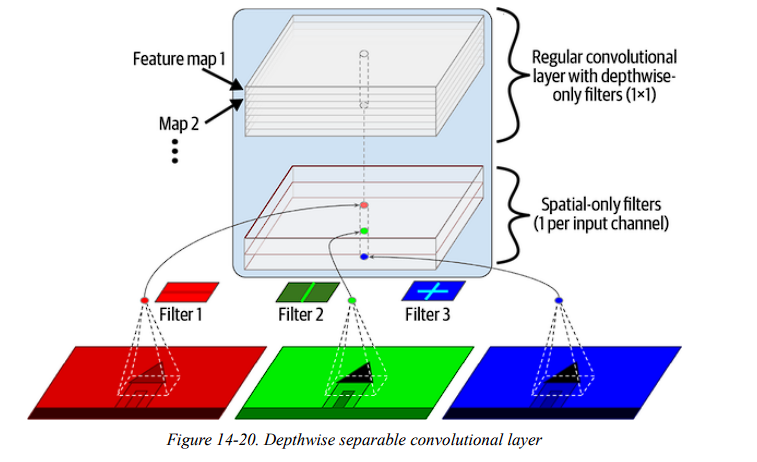

3. it is composed of two parts: the first part applies a
single spatial filter to each input feature map, then the second part looks
exclusively for cross-channel patterns—it is just a regular convolutional
layer with 1 × 1 filters.

4. Since separable convolutional layers only have one spatial filter per input
channel, you should avoid using them after layers that have too few
channels, such as the input layer 


5. For this reason, the
Xception architecture starts with 2 regular convolutional layers, but then the
rest of the architecture uses only separable convolutions (34 in all), plus a
few max pooling layers and the usual final layers (a global average pooling
layer and a dense output layer).

6. you can think of an inception module
as an intermediate between a regular convolutional layer (which considers
spatial patterns and cross-channel patterns jointly) and a separable
convolutional layer (which considers them separately).

>NOTE: In practice, it seems
that separable convolutional layers often perform better.



### SENet
1. a SENet adds a small neural network,
called an SE block, to every inception module or residual unit in the original
architecture. (Figure 14-21)


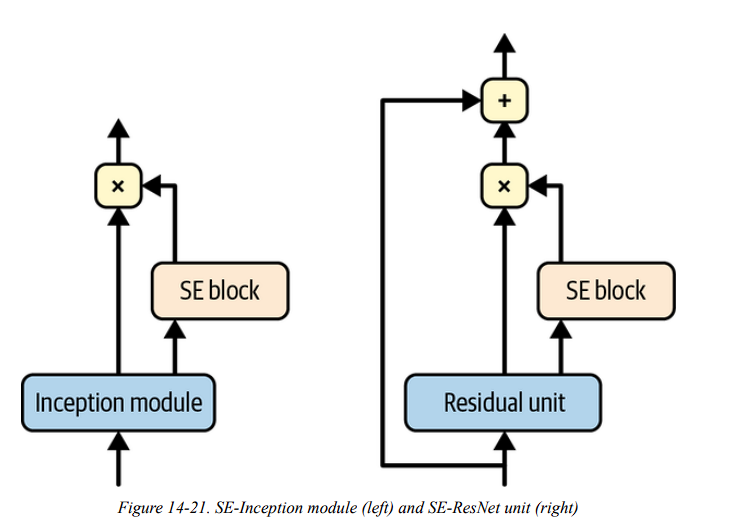

2. An SE block analyzes the output of the unit it is attached to, focusing
exclusively on the depth dimension (it does not look for any spatial pattern),
and it learns which features are usually most active together. It then uses
this information to recalibrate the feature maps, as shown in Figure 14-22.

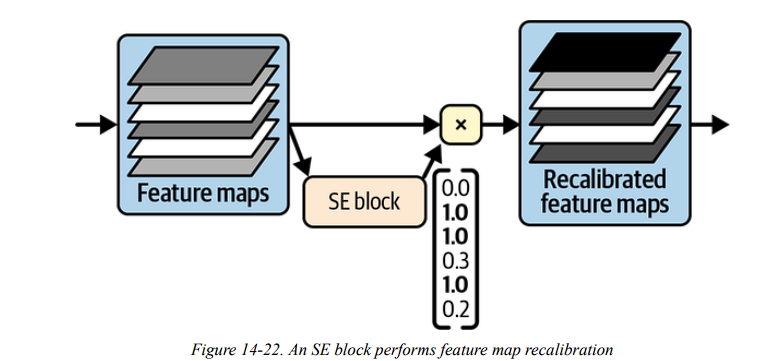

* For example, an SE block may learn that mouths, noses, and eyes usually
appear together in pictures: if you see a mouth and a nose, you should
expect to see eyes as well. So, if the block sees a strong activation in the
mouth and nose feature maps, but only mild activation in the eye feature
map, it will boost the eye feature map (more accurately, it will reduce
irrelevant feature maps). If the eyes were somewhat confused with
something else, this feature map recalibration will help resolve the
ambiguity.

3. An SE block is composed of just three layers: a global average pooling
layer, a hidden dense layer using the ReLU activation function, and a dense
output layer using the sigmoid activation function. (see Figure 14-23).


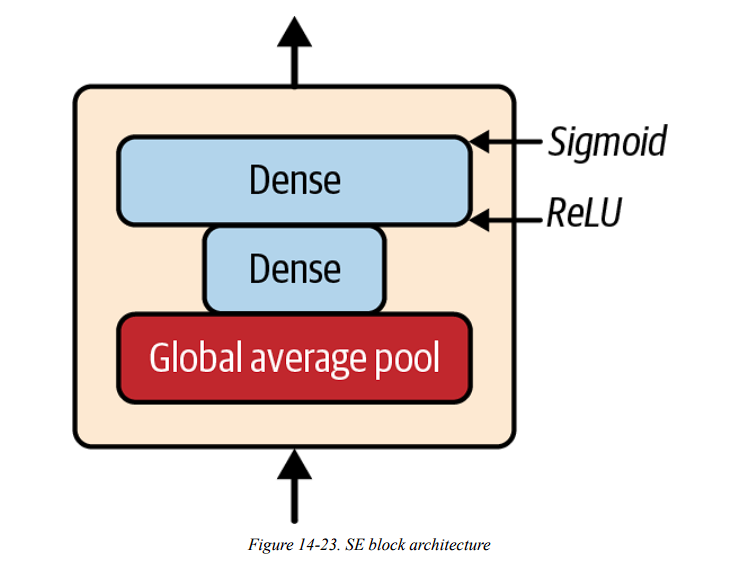

* global average pooling layer computes the mean activation
for each feature map.

* The next layer is where the “squeeze” happens: this layer has
significantly fewer than 256 neurons—typically 16 times fewer than the
number of feature maps (e.g., 16 neurons).
This is a lowdimensional vector representation (i.e., an embedding) of the distribution of
feature responses. This bottleneck step forces the SE block to learn a
general representation of the feature combinations.

* Finally, the output layer takes the embedding and outputs a recalibration
vector containing one number per feature map (e.g., 256), each between 0
and 1. The feature maps are then multiplied by this recalibration vector, so
irrelevant features (with a low recalibration score) get scaled down while
relevant features (with a recalibration score close to 1) are left alone.




### Other Noteworthy Architectures:

1. ResNeXt:

* ResNeXt improves the residual units in ResNet. Whereas the residual
units in the best ResNet models just contain 3 convolutional layers each,
the ResNeXt residual units are composed of many parallel stacks (e.g.,
32 stacks), with 3 convolutional layers each. However, the first two
layers in each stack only use a few filters (e.g., just four), so the overall
number of parameters remains the same as in ResNet. Then the outputs
of all the stacks are added together, and the result is passed to the next
residual unit (along with the skip connection).


2. DenseNet:

* A DenseNet is composed of several dense blocks, each made up of a
few densely connected convolutional layers. This architecture achieved
excellent accuracy while using comparatively few parameters. What
does “densely connected” mean? The output of each layer is fed as
input to every layer after it within the same block. For example, layer 4
in a block takes as input the depthwise concatenation of the outputs of
layers 1, 2, and 3 in that block. Dense blocks are separated by a few
transition layers.

3. MobileNet:

* MobileNets are streamlined models designed to be lightweight and fast,
making them popular in mobile and web applications. They are based
on depthwise separable convolutional layers, like Xception. The authors
proposed several variants, trading a bit of accuracy for faster and
smaller models.

4. CSPNet:

* A Cross Stage Partial Network (CSPNet) is similar to a DenseNet, but
part of each dense block’s input is concatenated directly to that block’s
output, without going through the block.

5. EfficientNet:

* EfficientNet is arguably the most important model in this list. The
authors proposed a method to scale any CNN efficiently, by jointly
increasing the depth (number of layers), width (number of filters per
layer), and resolution (size of the input image) in a principled way. This
is called compound scaling. 

* They used neural architecture search to find
a good architecture for a scaled-down version of ImageNet (with
smaller and fewer images), and then used compound scaling to create
larger and larger versions of this architecture. When EfficientNet
models came out, they vastly outperformed all existing models, across
all compute budgets, and they remain among the best models out there
today.

* . It is based on a logarithmic measure of the compute budget,
noted ϕ: if your compute budget doubles, then ϕ increases by 1. In other
words, the number of floating-point operations available for training is
proportional to 2^ϕ .

* Your CNN architecture’s depth, width, and resolution
should scale as α^ϕ , β^ϕ , and γ^ϕ , respectively. The factors α, β, and γ must be
greater than 1, and α + β^2 + γ^2 should be close to 2. The optimal values for
these factors depend on the CNN’s architecture.

* To find the optimal values
for the EfficientNet architecture, the authors started with a small baseline
model (EfficientNetB0), fixed ϕ = 1, and simply ran a grid search: they
found α = 1.2, β = 1.1, and γ = 1.1. They then used these factors to create
several larger architectures, named EfficientNetB1 to EfficientNetB7, for
increasing values of ϕ.




### Choosing the Right CNN Architecture

1. You can find the full list at https://keras.io/api/applications. For each model, the table shows the Keras class name to use (in the
tf.keras.applications package), the model’s size in MB, the top-1 and
top-5 validation accuracy on the ImageNet dataset, the number of
parameters (millions), and the inference time on CPU and GPU in ms, using
batches of 32 images on reasonably powerful hardware. For each column,
the best value is highlighted. 

### Implementing a ResNet-34 CNN Using Keras

First, we’ll create a ResidualUnit
layer:


In [32]:
DefaultConv2D = partial(tf.keras.layers.Conv2D, kernel_size=3, strides=1,
                        padding="same", kernel_initializer="he_normal",
                        use_bias=False)

class ResidualUnit(tf.keras.layers.Layer):
    def __init__(self, filters, strides=1, activation="relu", **kwargs):
        super().__init__(**kwargs)
        self.activation = tf.keras.activations.get(activation)
        self.main_layers = [
            DefaultConv2D(filters, strides=strides),
            tf.keras.layers.BatchNormalization(),
            self.activation,
            DefaultConv2D(filters),
            tf.keras.layers.BatchNormalization()
        ]
        self.skip_layers = []
        if strides > 1:
            self.skip_layers = [
                DefaultConv2D(filters, kernel_size=1, strides=strides),
                tf.keras.layers.BatchNormalization()
            ]

    def call(self, inputs):
        Z = inputs
        for layer in self.main_layers:
            Z = layer(Z)
        skip_Z = inputs
        for layer in self.skip_layers:
            skip_Z = layer(skip_Z)
        return self.activation(Z + skip_Z)

Now we can build a ResNet-34 using a Sequential model

In [34]:
model =tf.keras.Sequential([
    DefaultConv2D(64,kernel_size=7,strides=2,
                  input_shape=[224,224,3]),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation("relu"),
    tf.keras.layers.MaxPool2D(pool_size=3,strides=2,
                              padding="same"),
])

"""the first 3 RUs have 64 filters, then
the next 4 RUs have 128 filters, and so on. At each iteration, we must set
the stride to 1 when the number of filters is the same as in the previous RU,
or else we set it to 2; then we add the ResidualUnit, and finally we update
prev_filters.
"""


prev_filters = 64
for filters in [64] * 3 + [128] * 4 + [256] * 6 + [512] * 3:
    strides = 1 if filters == prev_filters else 2
    model.add(ResidualUnit(filters,strides=strides))
    prev_filters = filters


model.add(tf.keras.layers.GlobalAvgPool2D())
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(10,activation="softmax"))


### Using Pretrained Models from Keras

1. ResNet-50 model

This will create a ResNet-50 model and download weights
pretrained on the ImageNet dataset. To use it, you first need to ensure that
the images have the right size. A ResNet-50 model expects 224 × 224–pixel
images (other models may expect other sizes, such as 299 × 299),

In [ ]:
model = tf.keras.applications.ResNet50(weights="imagenet")

102967424/102967424 ━━━━━━━━━━━━━━━━━━━━ 30s 0us/step


so let’s
use Keras’s Resizing layer (introduced in Chapter 13) to resize two sample
images (after cropping them to the target aspect ratio):


In [ ]:
images = load_sample_images()["images"]
images_resized = tf.keras.layers.Resizing(height=224,
                                          width=224,
                                          crop_to_aspect_ratio = True)(images)


The pretrained models assume that the images are preprocessed in a specific
way. In some cases they may expect the inputs to be scaled from 0 to 1, or
from –1 to 1, and so on. Each model provides a preprocess_input()
function that you can use to preprocess your images. These functions
assume that the original pixel values range from 0 to 255.

In [ ]:
inputs = tf.keras.applications.resnet50.preprocess_input(images_resized)


Now we can use the pretrained model to make predictions:

In [ ]:
"""the output Y_proba is a matrix with one row per image and one
column per class (in this case, there are 1,000 classes)"""
Y_proba = model.predict(inputs)
Y_proba.shape

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


(2, 1000)

If you want to
display the top K predictions, including the class name and the estimated
probability of each predicted class, use the decode_predictions()
function. For each image, it returns an array containing the top K
predictions, where each prediction is represented as an array containing the
class identifier, its name, and the corresponding confidence score:

In [ ]:
top_K = tf.keras.applications.resnet50.decode_predictions(Y_proba,top=3)
for image_index in range(len(images)):
    print(f"Image #{image_index}")
    for class_id, name, y_proba in top_K[image_index]:
        print(f" {class_id} - {name:12s} {y_proba:.2%}")



35363/35363 ━━━━━━━━━━━━━━━━━━━━ 0s 1us/step
Image #0
 n03598930 - jigsaw_puzzle 30.68%
 n02782093 - balloon      17.17%
 n03888257 - parachute    5.57%
Image #1
 n04209133 - shower_cap   34.37%
 n09229709 - bubble       11.41%
 n02782093 - balloon      9.46%


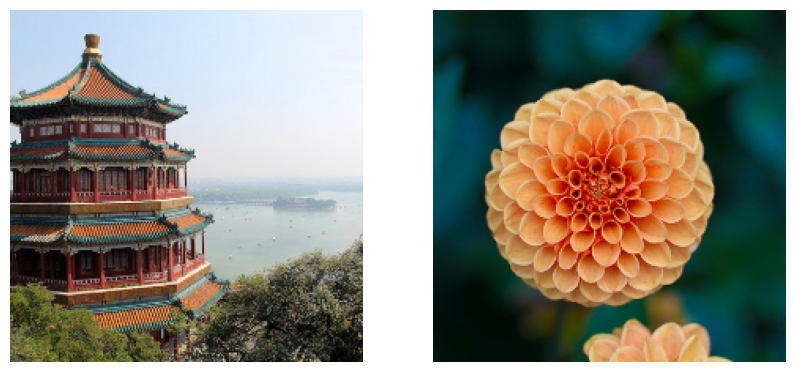

In [71]:
# extra code – displays the cropped and resized images

plt.figure(figsize=(10, 6))
for idx in (0, 1):
    plt.subplot(1, 2, idx + 1)
    plt.imshow(images_resized[idx] / 255)
    plt.axis("off")

plt.show()

But what if you want to use an image classifier for classes of images that
are not part of ImageNet? In that case, you may still benefit from the
pretrained models by using them to perform transfer learning? 

### Pretrained Models for Transfer Learning

1. If you want to build an image classifier but you do not have enough data to
train it from scratch, then it is often a good idea to reuse the lower layers of
a pretrained model.



let’s train a
model to classify pictures of flowers, reusing a pretrained Xception model.

First, we’ll load the flowers dataset using TensorFlow Datasets

In [ ]:
import tensorflow_datasets as tfds
"""Note that you can get information about the dataset by setting
 with_info=True.
  
there is only a "train" dataset """
dataset, info = tfds.load("tf_flowers",as_supervised=True, with_info=True)
dataset_size = info.splits["train"].num_examples # 3670
class_names = info.features["label"].names # ["dandelion", "daisy", ...]
n_classes = info.features["label"].num_classes # 5

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling C:\Users\haide\tensorflow_datasets\tf_flowers\incomplete.9FPLN1_3.0.1\tf_flowers-train.tfrecord*...:…

Dataset tf_flowers downloaded and prepared to C:\Users\haide\tensorflow_datasets\tf_flowers\3.0.1. Subsequent calls will reuse this data.


In [68]:
dataset_size

3670

In [69]:
class_names

['dandelion', 'daisy', 'tulips', 'sunflowers', 'roses']

In [70]:
n_classes

5

 Let’s call tfds.load()
again, but this time taking the first 10% of the dataset for testing, the next
15% for validation, and the remaining 75% for training:

In [ ]:
test_set_raw, valid_set_raw, train_set_raw = tfds.load(
    "tf_flowers",
    split=["train[:10%]","train[10%:25%]","train[25%:]"],
    as_supervised=True
)

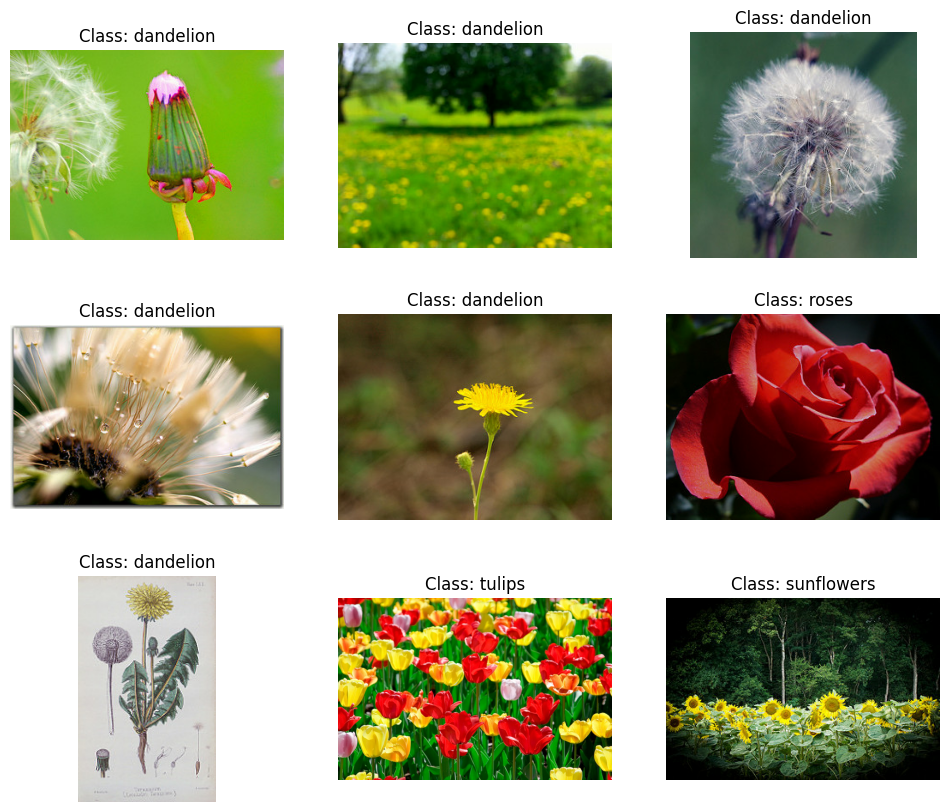

In [67]:
# extra code – displays the first 9 images in the validation set

plt.figure(figsize=(12, 10))
index = 0
for image, label in valid_set_raw.take(9):
    index += 1
    plt.subplot(3, 3, index)
    plt.imshow(image)
    plt.title(f"Class: {class_names[label]}")
    plt.axis("off")

plt.show()

All three datasets contain individual images. We need to batch them, but for this we first need to ensure they all have the same size, or else batching will not work. We can use a Resizing layer for this. We must also call the tf.keras.applications.xception.preprocess_input() function to preprocess the images appropriately for the Xception model. We will also add shuffling and prefetching to the training dataset.

In [ ]:
"""We must also call the
tf.keras.applications.xception.preprocess_input() function to
preprocess the images appropriately for the Xception model. Lastly, we’ll
also shuffle the training set and use prefetching:"""

batch_size = 32
preprocess = tf.keras.Sequential([
    tf.keras.layers.Resizing(height=224,width=224,
                             crop_to_aspect_ratio = True),
    tf.keras.layers.Lambda(tf.keras.applications.xception.preprocess_input)
])

train_set = train_set_raw.map(lambda X,y: (preprocess(X),y))
train_set = train_set.shuffle(1000,seed=42).batch(batch_size).prefetch(1)
valid_set = valid_set_raw.map(lambda X,y: (preprocess(X),y)).batch(batch_size)
test_set = test_set_raw.map(lambda X,y: (preprocess(X),y)).batch(batch_size)


Now each batch contains 32 images, all of them 224 × 224 pixels, with
pixel values ranging from –1 to 1. Perfect!

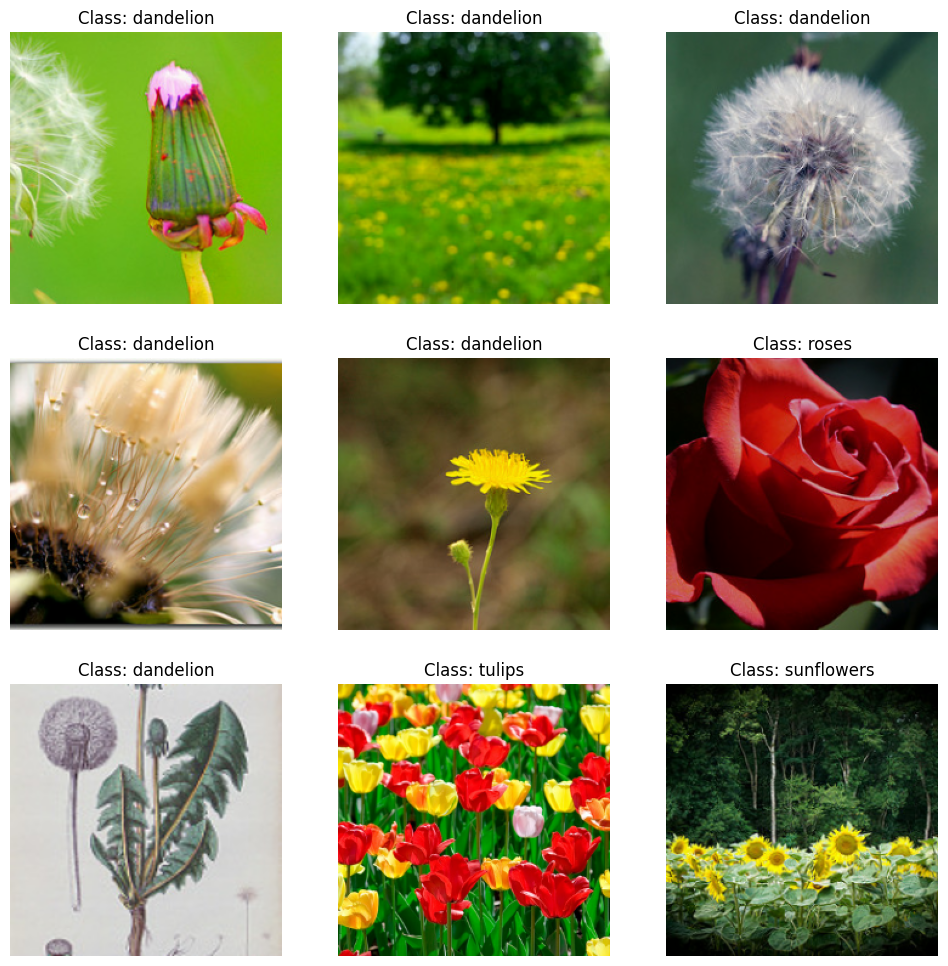

In [66]:
# extra code – displays the first 9 images in the first batch of valid_set

plt.figure(figsize=(12, 12))
for X_batch, y_batch in valid_set.take(1):
    for index in range(9):
        plt.subplot(3, 3, index + 1)
        plt.imshow((X_batch[index] + 1) / 2)  # rescale to 0–1 for imshow()
        plt.title(f"Class: {class_names[y_batch[index]]}")
        plt.axis("off")

plt.show()

Since the dataset is not very large, a bit of data augmentation will certainly
help. Let’s create a data augmentation model that we will embed in our final
model. During training, it will randomly flip the images horizontally, rotate
them a little bit, and tweak the contrast:

In [26]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip(mode="horizontal",seed=42),
    tf.keras.layers.RandomRotation(factor=0.05,seed=42),
    tf.keras.layers.RandomContrast(factor=0.2,seed=42)
])

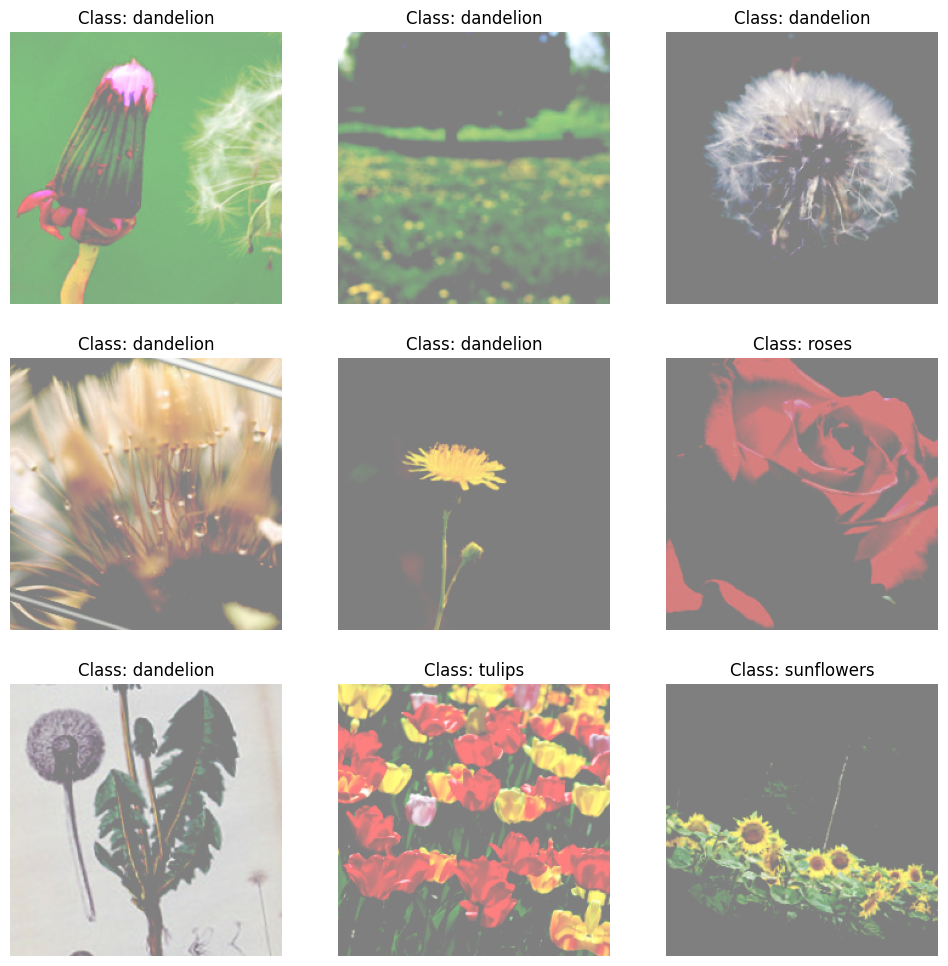

In [72]:
# extra code – displays the same first 9 images, after augmentation

plt.figure(figsize=(12, 12))
for X_batch, y_batch in valid_set.take(1):
    X_batch_augmented = data_augmentation(X_batch, training=True)
    for index in range(9):
        plt.subplot(3, 3, index + 1)
        # We must rescale the images to the 0-1 range for imshow(), and also
        # clip the result to that range, because data augmentation may
        # make some values go out of bounds (e.g., RandomContrast in this case).
        plt.imshow(np.clip((X_batch_augmented[index] + 1) / 2, 0, 1))
        plt.title(f"Class: {class_names[y_batch[index]]}")
        plt.axis("off")

plt.show()

>TIP:
The tf.keras.preprocessing.image.ImageDataGenerator class makes it easy to
load images from disk and augment them in various ways: you can shift each image,
rotate it, rescale it, flip it horizontally or vertically, shear it, or apply any transformation
function you want to it. This is very convenient for simple projects. However, a tf.data
pipeline is not much more complicated, and it’s generally faster. Moreover, if you have a
GPU and you include the preprocessing or data augmentation layers inside your model,
they will benefit from GPU acceleration during training.

Next let’s load an Xception model, pretrained on ImageNet.


In [74]:
"""We exclude the
top of the network by setting include_top=False. This excludes the global
average pooling layer and the dense output layer. We then add our own
global average pooling layer (feeding it the output of the base model),
followed by a dense output layer with one unit per class, using the softmax
activation function. Finally, we wrap all this in a Keras Model:"""


base_model = tf.keras.applications.xception.Xception(weights="imagenet",
                                                     include_top = False)
avg = tf.keras.layers.GlobalAveragePooling2D()(base_model.output)
output = tf.keras.layers.Dense(n_classes,activation="softmax")(avg)
model = tf.keras.Model(inputs=base_model.input,outputs=output)


 it’s usually a good idea to freeze the weights of
the pretrained layers, at least at the beginning of training:

In [75]:
"""WARNING
Since our model uses the base model’s layers directly, rather than the base_model
object itself, setting base_model.trainable=False would have no effect."""

for layer in base_model.layers:
    layer.trainable = False

Finally, we can compile the model and start training:

In [76]:
optimizer = tf.keras.optimizers.SGD(learning_rate=0.1,momentum=0.9)
model.compile(loss="sparse_categorical_crossentropy",
              optimizer=optimizer,
              metrics=["accuracy"])
history  = model.fit(train_set,
                     validation_data=valid_set,
                     epochs=3)

"""I trained it on COlab due to GPU facility. so rest of the code results
will be just documented.

results:

Epoch 1/3
86/86 ━━━━━━━━━━━━━━━━━━━━ 89s 547ms/step - accuracy: 0.7260 - loss: 0.7590 - val_accuracy: 0.2668 - val_loss: 154.5114
Epoch 2/3
86/86 ━━━━━━━━━━━━━━━━━━━━ 39s 446ms/step - accuracy: 0.8481 - loss: 0.4582 - val_accuracy: 0.4701 - val_loss: 3.9786
Epoch 3/3
86/86 ━━━━━━━━━━━━━━━━━━━━ 40s 461ms/step - accuracy: 0.9171 - loss: 0.2582 - val_accuracy: 0.7459 - val_loss: 1.1264
"""

Epoch 1/3
86/86 ━━━━━━━━━━━━━━━━━━━━ 25580s 301s/step - accuracy: 0.7313 - loss: 0.7935 - val_accuracy: 0.8004 - val_loss: 0.7934
Epoch 2/3
42/86 ━━━━━━━━━━━━━━━━━━━━ 1:51 3s/step - accuracy: 0.8786 - loss: 0.4808

KeyboardInterrupt: 

In [ ]:
for indices in zip(range(33), range(33, 66), range(66, 99), range(99, 132)):
    for idx in indices:
        print(f"{idx:3}: {base_model.layers[idx].name:22}", end="")
    print()

>WARNING
If you are running in Colab, make sure the runtime is using a GPU: select Runtime →
“Change runtime type”, choose “GPU” in the “Hardware accelerator” drop-down menu,
then click Save. It’s possible to train the model without a GPU, but it will be terribly
slow (minutes per epoch, as opposed to seconds).

After training the model for a few epochs, its validation accuracy should
reach a bit over 80% and then stop improving. This means that the top
layers are now pretty well trained, and we are ready to unfreeze some of the
base model’s top layers, then continue training.

For example, let’s unfreeze
layers 56 and above (that’s the start of residual unit 7 out of 14, as you can
see if you list the layer names):

In [ ]:
for layer in base_model.layers[56:]:
    layer.trainable = True

Don’t forget to compile the model whenever you freeze or unfreeze layers.
Also make sure to use a much lower learning rate to avoid damaging the
pretrained weights:


In [ ]:
optimizer = tf.keras.optimizers.SGD(learning_rate=0.01,
                                    momentum=0.9)
model.compile(loss="sparse_categorical_crossentropy",
              optimizer=optimizer,
              metrics=["accuracy"])

history = model.fit(train_set,
                    validation_data = valid_set,
                    epochs=10)

"""
results:

Epoch 1/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 68s 504ms/step - accuracy: 0.9422 - loss: 0.1560 - val_accuracy: 0.9002 - val_loss: 0.2808
Epoch 2/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 41s 465ms/step - accuracy: 0.9777 - loss: 0.0725 - val_accuracy: 0.9256 - val_loss: 0.2251
Epoch 3/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 42s 475ms/step - accuracy: 0.9870 - loss: 0.0409 - val_accuracy: 0.9256 - val_loss: 0.2239
Epoch 4/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 81s 461ms/step - accuracy: 0.9919 - loss: 0.0271 - val_accuracy: 0.9274 - val_loss: 0.2199
Epoch 5/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 41s 474ms/step - accuracy: 0.9948 - loss: 0.0189 - val_accuracy: 0.9220 - val_loss: 0.2540
Epoch 6/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 41s 474ms/step - accuracy: 0.9935 - loss: 0.0179 - val_accuracy: 0.9256 - val_loss: 0.2516
Epoch 7/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 42s 477ms/step - accuracy: 0.9952 - loss: 0.0131 - val_accuracy: 0.9256 - val_loss: 0.2697
Epoch 8/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 42s 480ms/step - accuracy: 0.9977 - loss: 0.0097 - val_accuracy: 0.9238 - val_loss: 0.2810
Epoch 9/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 42s 479ms/step - accuracy: 0.9939 - loss: 0.0195 - val_accuracy: 0.9328 - val_loss: 0.2644
Epoch 10/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 81s 466ms/step - accuracy: 0.9970 - loss: 0.0082 - val_accuracy: 0.9328 - val_loss: 0.2580



"""

you can start training amazing image classifiers on
your own images and classes! But there’s more to computer vision than just
classification. For example, what if you also want to know where the flower
is in a picture? Let’s look at this now.

### Classification and Localization

1. we have four
numbers to predict. It does not require much change to the model; we just
need to add a second dense output layer with four units (typically on top of
the global average pooling layer), and it can be trained using the MSE loss:

In [ ]:
base_model = tf.keras.applications.xception.Xception(weights="imagenet",
                                                     include_top=False)
avg = tf.keras.layers.GlobalAveragePooling2D()(base_model.output)
class_output = tf.keras.layers.Dense(n_classes, activation="softmax")(avg)

loc_output = tf.keras.layers.Dense(4)(avg)
model = tf.keras.Model(inputs=base_model.input,
                       outputs=[class_output,loc_output])
model.compile(loss=["sparse_categorical_crossentropy","mse"],
              loss_weights=[0.8,0.2], # Depends on what u care most about
              optimizer = optimizer,metrics=["accuracy"])

In [ ]:
# extra code – fits the model using random target bounding boxes (in real life
#              you would need to create proper targets instead)

def add_random_bounding_boxes(images, labels):
    fake_bboxes = tf.random.uniform([tf.shape(images)[0], 4])
    return images, (labels, fake_bboxes)

fake_train_set = train_set.take(5).repeat(2).map(add_random_bounding_boxes)
model.fit(fake_train_set, epochs=2)

But now we have a problem: the flowers dataset does not have bounding
boxes around the flowers. So, we need to add them ourselves. This is often
one of the hardest and most costly parts of a machine learning project:
getting the labels

It’s a good idea to spend time looking for the right tools.
To annotate images with bounding boxes, you may want to use an open
source image labeling tool like VGG Image Annotator, LabelImg,
OpenLabeler, or ImgLab, or perhaps a commercial tool like LabelBox or
Supervisely. You may also want to consider crowdsourcing platforms such
as Amazon Mechanical Turk if you have a very large number of images to
annotate.

Now let’s suppose you’ve obtained the bounding boxes for every image in
the flowers dataset (for now we will assume there is a single bounding box
per image). You then need to create a dataset whose items will be batches of
preprocessed images along with their class labels and their bounding boxes.
Each item should be a tuple of the form (images, (class_labels,
bounding_boxes)). Then you are ready to train your model!

>TIP
The bounding boxes should be normalized so that the horizontal and vertical
coordinates, as well as the height and width, all range from 0 to 1. Also, it is common to
predict the square root of the height and width rather than the height and width directly:
this way, a 10-pixel error for a large bounding box will not be penalized as much as a
10-pixel error for a small bounding box.


The MSE often works fairly well as a cost function to train the model, but it
is not a great metric to evaluate how well the model can predict bounding
boxes. The most common metric for this is the intersection over union
(IoU): the area of overlap between the predicted bounding box and the
target bounding box, divided by the area of their union (see Figure 14-24).

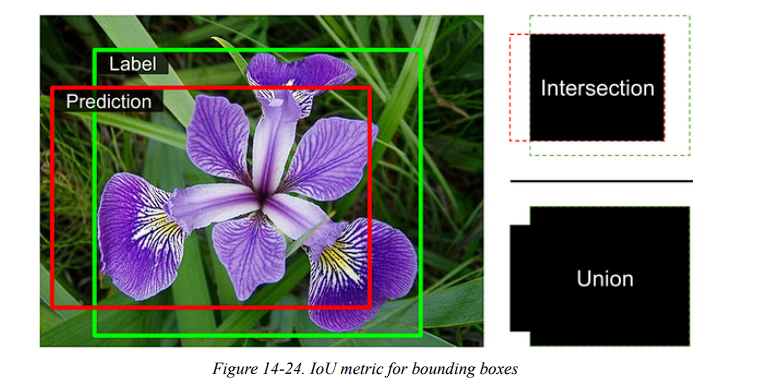

Classifying and localizing a single object is nice, but what if the images
contain multiple objects (as is often the case in the flowers dataset)?

### Object Detection
 
1. The task of classifying and localizing multiple objects in an image is called
object detection.

2. The CNN was generally trained to predict not only class
probabilities and a bounding box, but also an objectness score: this is the
estimated probability that the image does indeed contain an object centered
near the middle.

3. This sliding-CNN approach is illustrated in Figure 14-25. In this example,
the image was chopped into a 5 × 7 grid, and we see a CNN—the thick
black rectangle—sliding across all 3 × 3 regions and making predictions at
each step.

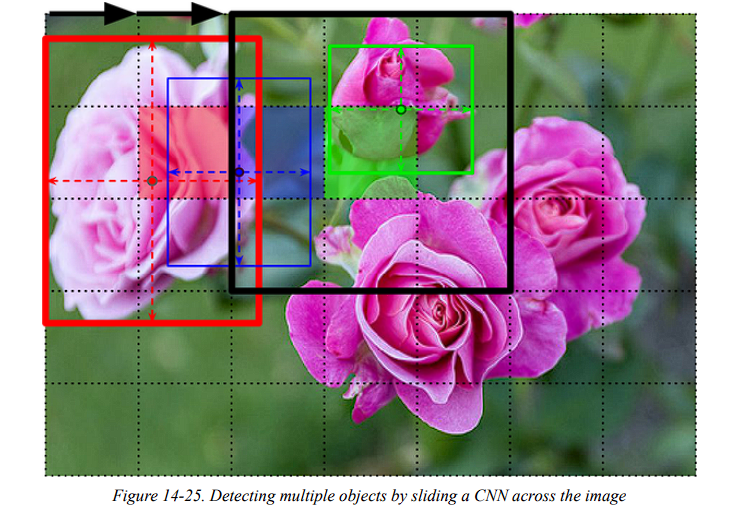

4. This technique is fairly straightforward, but as you can see it will often
detect the same object multiple times, at slightly different positions. Some
postprocessing is needed to get rid of all the unnecessary bounding boxes.
A common approach for this is called non-max suppression.

* First, get rid of all the bounding boxes for which the objectness score
is below some threshold: since the CNN believes there’s no object at
that location, the bounding box is useless.

* Find the remaining bounding box with the highest objectness score,
and get rid of all the other remaining bounding boxes that overlap a lot
with it (e.g., with an IoU greater than 60%). 

*  Repeat step 2 until there are no more bounding boxes to get rid of.


there is a much faster way to slide a CNN across an image:
using a fully convolutional network (FCN).


### Fully Convolutional Networks:

1. for semantic segmentation (the task of classifying every pixel in an
image according to the class of the object it belongs to).

2. The authors
pointed out that you could replace the dense layers at the top of a CNN with
convolutional layers.

>TIP
To convert a dense layer to a convolutional layer, the number of filters in the
convolutional layer must be equal to the number of units in the dense layer, the filter
size must be equal to the size of the input feature maps, and you must use "valid"
padding. The stride may be set to 1 or more, as you will see shortly.

3. Why is this important? 

* while a dense layer expects a specific input
size (since it has one weight per input feature), a convolutional layer will
happily process images of any size. (however, it does expect its inputs to
have a specific number of channels, since each kernel contains a different
set of weights for each input channel). an FCN contains only
convolutional layers (and pooling layers, which have the same property), it
can be trained and executed on images of any size!

* We can now convert the CNN’s dense layers to convolutional layers. In
fact, we don’t even need to retrain it; we can just copy the weights from the
dense layers to the convolutional layers! Alternatively, we could have
converted the CNN into an FCN before training.

*  the FCN
will process the whole image only once, and it will output an 8 × 8 grid
where each cell contains 10 numbers (5 class probabilities, 1 objectness
score, and 4 bounding box coordinates). It’s exactly like taking the original
CNN and sliding it across the image using 8 steps per row and 8 steps per
column.

* To visualize this, imagine chopping the original image into a 14 ×
14 grid, then sliding a 7 × 7 window across this grid; there will be 8 × 8 =
64 possible locations for the window, hence 8 × 8 predictions. However, the
FCN approach is much more efficient, since the network only looks at the
image once. In fact, You Only Look Once (YOLO) is the name of a very
popular object detection architecture.

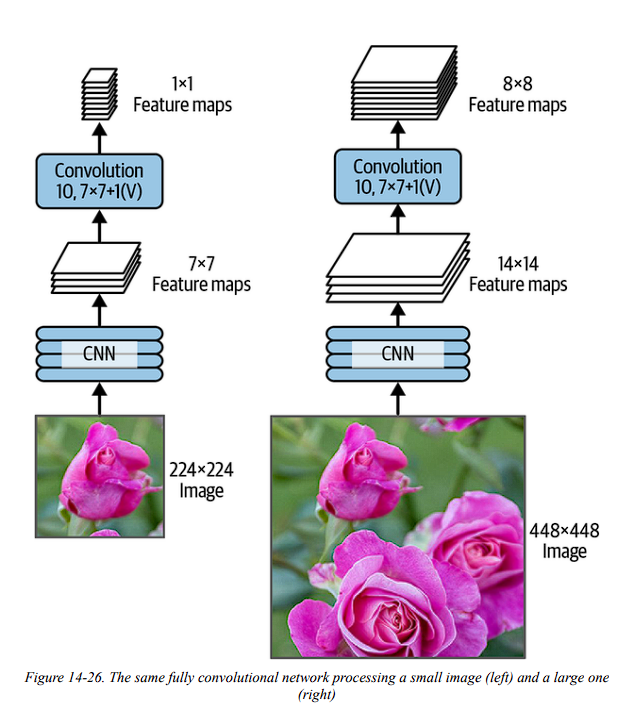



### You Only Look Once

1. YOLO’s architecture is quite
similar to the one we just discussed, but with a few important differences:

* For each grid cell, YOLO only considers objects whose bounding box
center lies within that cell. The bounding box coordinates are relative
to that cell, where (0, 0) means the top-left corner of the cell and (1, 1)
means the bottom right. However, the bounding box’s height and width
may extend well beyond the cell.

* It outputs two bounding boxes for each grid cell (instead of just one),
which allows the model to handle cases where two objects are so close
to each other that their bounding box centers lie within the same cell.
Each bounding box also comes with its own objectness score.


* YOLO also outputs a class probability distribution for each grid cell,
predicting 20 class probabilities per grid cell since YOLO was trained
on the PASCAL VOC dataset, which contains 20 classes. This
produces a coarse class probability map.

* Note that the model predicts
one class probability distribution per grid cell, not per bounding box.
However, it’s possible to estimate class probabilities for each bounding
box during postprocessing, by measuring how well each bounding box
matches each class in the class probability map.

### Mean Average Precision

* A very common metric used in object detection tasks.

* Suppose the classifier has 90% precision at 10% recall, but 96%
precision at 20% recall. There’s really no trade-off here: it simply
makes more sense to use the classifier at 20% recall rather than at 10%
recall, as you will get both higher recall and higher precision. So
instead of looking at the precision at 10% recall, we should really be
looking at the maximum precision that the classifier can offer with at
least 10% recall. It would be 96%, not 90%. 

* Therefore, one way to get a
fair idea of the model’s performance is to compute the maximum
precision you can get with at least 0% recall, then 10% recall, 20%, and
so on up to 100%, and then calculate the mean of these maximum
precisions. This is called the average precision (AP) metric. Now when
there are more than two classes, we can compute the AP for each class,
and then compute the mean AP (mAP). That’s it!

* In an object detection system, there is an additional level of complexity:
what if the system detected the correct class, but at the wrong location
(i.e., the bounding box is completely off)? Surely we should not count
this as a positive prediction. One approach is to define an IoU
threshold: for example, we may consider that a prediction is correct
only if the IoU is greater than, say, 0.5, and the predicted class is
correct. The corresponding mAP is generally noted mAP@0.5 (or
mAP@50%, or sometimes just AP_50 ).

* In others (such as
the COCO competition), the mAP is computed for different IoU
thresholds (0.50, 0.55, 0.60, …, 0.95), and the final metric is the mean
of all these mAPs (noted mAP@[.50:.95] or mAP@[.50:0.05:.95]). Yes,
that’s a mean mean average


In [ ]:
def maximum_precisions(precisions):
    return np.flip(np.maximum.accumulate(np.flip(precisions)))

In [ ]:
recalls = np.linspace(0, 1, 11)

precisions = [0.91, 0.94, 0.96, 0.94, 0.95, 0.92, 0.80, 0.60, 0.45, 0.20, 0.10]
max_precisions = maximum_precisions(precisions)
mAP = max_precisions.mean()
plt.plot(recalls, precisions, "ro--", label="Precision")
plt.plot(recalls, max_precisions, "bo-", label="Max Precision")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.plot([0, 1], [mAP, mAP], "g:", linewidth=3, label="mAP")
plt.grid(True)
plt.axis([0, 1, 0, 1])
plt.legend(loc="lower center")
plt.show()

2. SSD and EfficientDet are “look once” detection models, similar to YOLO.
EfficientDet is based on the EfficientNet convolutional architecture. Faster
R-CNN is more complex: the image first goes through a CNN, then the
output is passed to a region proposal network (RPN) that proposes
bounding boxes that are most likely to contain an object; a classifier is then
run for each bounding box, based on the cropped output of the CNN. The
best place to start using these models is TensorFlow Hub’s excellent  [object
detection tutorial](https://homl.info/objdet). 


### Object Tracking

1. One of the most popular object tracking systems is DeepSORT. It is based
on a combination of classical algorithms and deep learning:

* It uses Kalman filters to estimate the most likely current position of an
object given prior detections, and assuming that objects tend to move
at a constant speed.

* It uses a deep learning model to measure the resemblance between new
detections and existing tracked objects.

* Lastly, it uses the Hungarian algorithm to map new detections to
existing tracked objects (or to new tracked objects): this algorithm
efficiently finds the combination of mappings that minimizes the
distance between the detections and the predicted positions of tracked
objects, while also minimizing the appearance discrepancy.


2. For example, imagine a red ball that just bounced off a blue ball traveling in
the opposite direction. Based on the previous positions of the balls, the
Kalman filter will predict that the balls will go through each other: indeed,
it assumes that objects move at a constant speed, so it will not expect the
bounce. If the Hungarian algorithm only considered positions, then it would
happily map the new detections to the wrong balls, as if they had just gone
through each other and swapped colors. But thanks to the resemblance
measure, the Hungarian algorithm will notice the problem. Assuming the
balls are not too similar, the algorithm will map the new detections to the
correct balls.

> TIP
There are a few DeepSORT implementations available on GitHub, including a
TensorFlow implementation of YOLOv4 + DeepSORT:
https://github.com/theAIGuysCode/yolov4-deepsort . 




So far we have located objects using bounding boxes. This is often
sufficient, but sometimes you need to locate objects with much more
precision—for example, to remove the background behind a person during
a videoconference call. Let’s see how to go down to the pixel level.

### Semantic Segmentation

1. In semantic segmentation, each pixel is classified according to the class of
the object it belongs to (e.g., road, car, pedestrian, building, etc.), as shown
in Figure 14-27.

>Note that different objects of the same class are not
distinguished. For example, all the bicycles on the right side of the
segmented image end up as one big lump of pixels. 

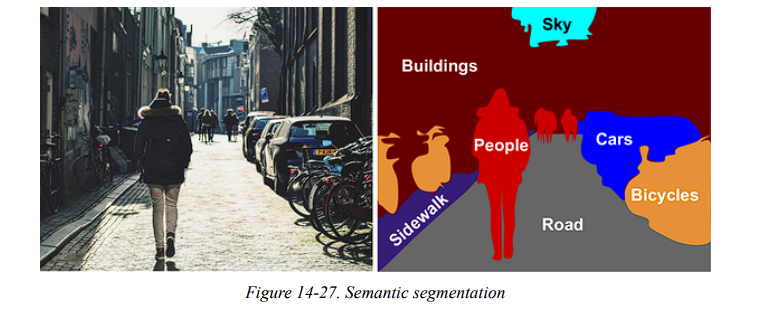

2. The main difficulty in
this task is that when images go through a regular CNN, they gradually lose
their spatial resolution (due to the layers with strides greater than 1); so, a
regular CNN may end up knowing that there’s a person somewhere in the
bottom left of the image, but it will not be much more precise than that.

3. there are many different approaches to tackle
this problem, some quite complex. However, a fairly simple solution was
proposed in the 2015 paper by Jonathan Long et al. I mentioned earlier, on
fully convolutional networks. The authors start by taking a pretrained CNN
and turning it into an FCN. The CNN applies an overall stride of 32 to the
input image (i.e., if you add up all the strides greater than 1), meaning the
last layer outputs feature maps that are 32 times smaller than the input
image. This is clearly too coarse, so they added a single upsampling layer
that multiplies the resolution by 32.

4. There are several solutions available for upsampling (increasing the size of
an image), such as bilinear interpolation, but that only works reasonably
well up to ×4 or ×8. Instead, they use a transposed convolutional layer:
this is equivalent to first stretching the image by inserting empty rows and
columns (full of zeros), then performing a regular convolution (see
Figure 14-28).

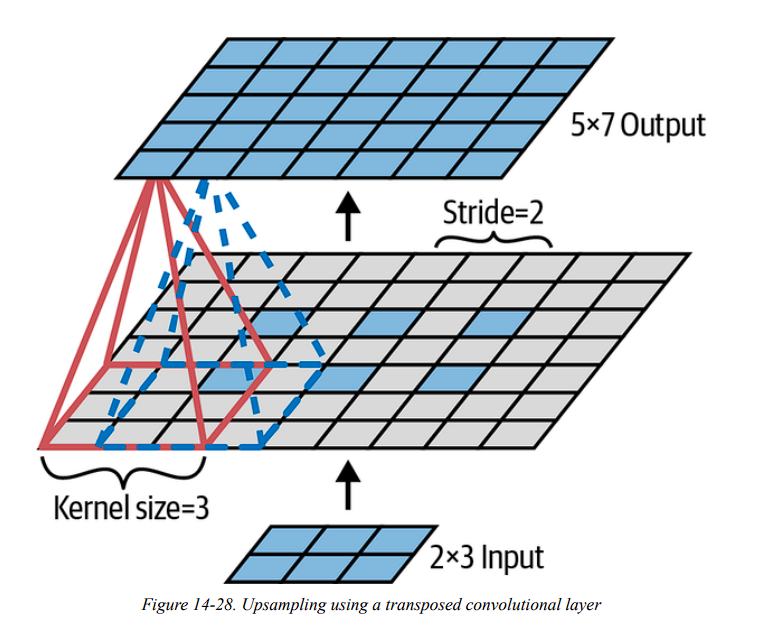

5. Alternatively, some people prefer to think of it as a regular
convolutional layer that uses fractional strides (e.g., the stride is 1/2 in
Figure 14-28). The transposed convolutional layer can be initialized to
perform something close to linear interpolation, but since it is a trainable
layer, it will learn to do better during training. In Keras, you can use the
Conv2DTranspose layer.


>NOTE
In a transposed convolutional layer, the stride defines how much the input will be
stretched, not the size of the filter steps, so the larger the stride, the larger the output
(unlike for convolutional layers or pooling layers)




### Other Kera Convolutional layers:

Keras also offers a few other kinds of convolutional layers:

* tf.keras.layers.Conv1D :
A convolutional layer for 1D inputs, such as time series or text
(sequences of letters or words), as you will see in Chapter 15.

* tf.keras.layers.Conv3D
A convolutional layer for 3D inputs, such as 3D PET scans.

* dilation_rate
Setting the dilation_rate hyperparameter of any convolutional
layer to a value of 2 or more creates an à-trous convolutional layer
(“à trous” is French for “with holes”). This is equivalent to using a
regular convolutional layer with a filter dilated by inserting rows
and columns of zeros (i.e., holes). For example, a 1 × 3 filter equal
to [[1,2,3]] may be dilated with a dilation rate of 4, resulting in a
dilated filter of [[1, 0, 0, 0, 2, 0, 0, 0, 3]]. This lets the
convolutional layer have a larger receptive field at no computational
price and using no extra parameters.

6. Using transposed convolutional layers for upsampling is OK, but still too
imprecise. To do better, Long et al. added skip connections from lower
layers: for example, they upsampled the output image by a factor of 2
(instead of 32), and they added the output of a lower layer that had this
double resolution. Then they upsampled the result by a factor of 16, leading
to a total upsampling factor of 32 (see Figure 14-29).

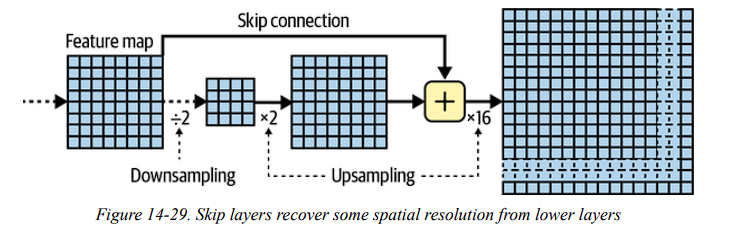

7. This recovered some
of the spatial resolution that was lost in earlier pooling layers. In their best
architecture, they used a second similar skip connection to recover even
finer details from an even lower layer. In short, the output of the original
CNN goes through the following extra steps: upsample ×2, add the output
of a lower layer (of the appropriate scale), upsample ×2, add the output of
an even lower layer, and finally upsample ×8. It is even possible to scale up
beyond the size of the original image: this can be used to increase the
resolution of an image, which is a technique called super-resolution.

8. Instance segmentation is similar to semantic segmentation, but instead of
merging all objects of the same class into one big lump, each object is
distinguished from the others (e.g., it identifies each individual bicycle). For
example the Mask R-CNN architecture, proposed in a 2017 paper by
Kaiming He et al., extends the Faster R-CNN model by additionally
producing a pixel mask for each bounding box.

9. So, not only do you get a
bounding box around each object, with a set of estimated class probabilities,
but you also get a pixel mask that locates pixels in the bounding box that
belong to the object. This model is available on TensorFlow Hub, pretrained
on the COCO 2017 dataset. The field is moving fast, though so if you want
to try the latest and greatest models, please check out the state-of-the-art
section of https://paperswithcode.com .

